# SDO/AIA

SDO/AIAデータは、JSOC (Joint Science Operations Center) から取得するのが一般的です。FidoはJSOCクライアントを内包しており、これを利用します 10。AIAデータは高時間分解能（例：aia.lev1_euv_12sシリーズで12秒ケイデンス）で提供されるため、指定時刻に非常に近い画像を取得できる可能性が高いです http://jsoc.stanford.edu/ajax/lookdata.html?ds=aia.lev1_euv_12s

http://jsoc2.stanford.edu/data/aia/synoptic/

- 94: Flaring corona
- 131: transition region, flaring corona
- 171: quiet corona, upper transition region
- 193: corona and hot flare plasma
- 211: active-region corona
- 304: chromosphere, transition region
- 335: active-region corona
- 1600: transition region, upper photosphere
- 1700: temperature minimum, photosphere
- 4500: photosphere

## 初期設定・関数

In [ ]:
import io
import os
from collections import defaultdict
from datetime import datetime
from pathlib import Path

import astropy.units as u
import astropy.visualization as vis
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import numpy as np
import sunpy.map
from astropy.time import Time
from astropy.visualization import ImageNormalize, PowerStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from matplotlib.ticker import FuncFormatter
from tqdm import tqdm
from astropy.io import fits
from datetime import timedelta

# --- 定数定義 ---
BASE_DATA_DIR = Path(r"D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata")
OUTPUT_DIR = Path(r"D:\wsl\home\kinno-7010\Research\SDO\AIA\output")


def plot_sdo_aia(datetime_str, channel_str):
    """
    指定された日時と波長チャンネルのSDO/AIA画像をWCSベースでプロットし、
    軸の目盛りラベルのみを太陽中心を(0,0)とするピクセル単位で表示します。
    太陽リムとグリッドはWCSに基づいて描画されます。
    """
    # 1. 日時とファイルパスの処理
    try:
        dt_obj = datetime.strptime(datetime_str, "%Y-%m-%d %H:%M")
        date_fmtd_for_fname = dt_obj.strftime("%Y%m%d")
        time_fmtd_for_fname = dt_obj.strftime("%H%M")
    except ValueError:
        print(
            f"エラー: 日時文字列 '{datetime_str}' の形式が無効です。"
            " 'YYYY-MM-DD HH:MM' 形式で指定してください。"
        )
        return

    wavelength_part_in_fname = channel_str.zfill(4)
    filename = f"AIA{date_fmtd_for_fname}_{time_fmtd_for_fname}_{wavelength_part_in_fname}.fits"
    file_path = BASE_DATA_DIR / channel_str / filename

    print(f"ターゲットファイルパス: {file_path}")

    try:
        aia_map = sunpy.map.Map(file_path)
        print(f"ファイル '{file_path}' を正常に読み込みました。")
    except FileNotFoundError:
        print(f"エラー: ファイルが見つかりません - {file_path}")
        return
    except Exception as e:
        print(f"ファイルの読み込み・初期処理中にエラーが発生しました: {e}")
        return

    image_data = aia_map.data
    wcs_info = aia_map.wcs

    # 5. データ正規化
    vmin_percentile = 1.0
    vmax_percentile = 99.5
    stretch_power = 0.5
    valid_data = image_data[np.isfinite(image_data)]
    norm = None
    if valid_data.size > 0:
        norm = ImageNormalize(
            vmin=np.percentile(valid_data, vmin_percentile),
            vmax=np.percentile(valid_data, vmax_percentile),
            stretch=PowerStretch(stretch_power),
            clip=True
        )

    # 6. ピクセルスケールを取得 (フォーマッタ関数で使用)
    cdelt1 = aia_map.meta.get('cdelt1')
    cdelt2 = aia_map.meta.get('cdelt2')

    use_pixel_formatter = False
    pixel_scale_x = 1.0
    pixel_scale_y = 1.0

    if cdelt1 is not None and cdelt2 is not None and cdelt1 != 0 and cdelt2 != 0:
        pixel_scale_x = abs(cdelt1)
        pixel_scale_y = abs(cdelt2)

        if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit'):
            if wcs_info.wcs.cunit[0] == u.arcsec and wcs_info.wcs.cunit[1] == u.arcsec:
                use_pixel_formatter = True
            else:
                print(f"警告: WCSの単位がarcsecではありません ({wcs_info.wcs.cunit[0]}, {wcs_info.wcs.cunit[1]})。ピクセル目盛りは無効です。")
        elif hasattr(wcs_info, 'wcs') and not hasattr(wcs_info.wcs, 'cunit'):
            print("警告: WCS CUNIT情報が見つかりません。ピクセル目盛りは無効です。")
        else:
            print("警告: WCSの単位を確認できません。ピクセル目盛りは無効です。")
    else:
        print("警告: FITSヘッダーからCDELT1またはCDELT2が取得できないか0です。ピクセル目盛りは無効です。")

    # 7. 目盛りフォーマッタ関数を定義
    def arcsec_to_pixel_offset_formatter(arcsec_value, pos, scale_arcsec_per_pixel):
        if scale_arcsec_per_pixel == 0:
            return f"{0:.0f}"
        pixel_offset = arcsec_value / scale_arcsec_per_pixel
        return f"{pixel_offset:.0f}"

    # 8. プロットの準備 (WCSAxesを使用)
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection=wcs_info)

    # 9. 画像のプロット
    im = ax.imshow(image_data, origin='lower', cmap=f'sdoaia{channel_str}', norm=norm)

    # 10. 太陽リムとグリッドの描画
    try:
        aia_map.draw_limb(axes=ax, color='white', linestyle='dashed', linewidth=1.2)
        aia_map.draw_grid(axes=ax, grid_spacing=15*u.deg, color='white', linestyle='dotted', linewidth=0.8, alpha=0.7)
        print("情報: 太陽リムとグリッドをWCSベースで描画しました。")
    except Exception as e_draw:
        print(f"警告: 太陽リムまたはグリッドの描画に失敗しました: {e_draw}")

    # 11. タイトルと軸ラベル、目盛りフォーマッタの設定
    title_str_parts = [
        f"SDO/AIA {int(channel_str)} Å",
        f"{dt_obj.strftime('%Y-%m-%d %H:%M:%S UT')}"
    ]
    if use_pixel_formatter:
        title_str_parts.append(f"Tick Labels in Pixels (Scale ≈ {pixel_scale_x:.2f}\" /pix)")

    ax.set_title("\n".join(title_str_parts), fontsize=12, pad=15)

    if use_pixel_formatter:
        ax.coords[0].set_major_formatter(FuncFormatter(lambda val, pos: arcsec_to_pixel_offset_formatter(val, pos, pixel_scale_x)))
        ax.coords[0].set_axislabel("Solar X (pixels from Sun center)")
        ax.coords[1].set_major_formatter(FuncFormatter(lambda val, pos: arcsec_to_pixel_offset_formatter(val, pos, pixel_scale_y)))
        ax.coords[1].set_axislabel("Solar Y (pixels from Sun center)")
    else:
        cunit1_fallback = wcs_info.wcs.cunit[0] if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit') else u.arcsec
        cunit2_fallback = wcs_info.wcs.cunit[1] if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit') else u.arcsec
        ax.coords[0].set_axislabel(f"Solar X ({cunit1_fallback})")
        ax.coords[1].set_axislabel(f"Solar Y ({cunit2_fallback})")

    plt.tight_layout()
    plt.show()


def normalize_log_stretch(data):
    """Applies LogStretch normalization to the data."""
    # LogStretchは負の値を扱えないため、ゼロや負の値を避けるためにクリッピングする
    data_clipped = np.maximum(data, 1e-5)
    normalizer = vis.ImageNormalize(data_clipped, stretch=vis.LogStretch(), clip=True)
    return normalizer(data_clipped)


def plot_sdo_aia_rgb(datetime_str,
                     channel_r_str="211",
                     channel_g_str="193",
                     channel_b_str="171"):
    """
    指定された日時のSDO/AIAデータ (3波長) を読み込み、RGB合成画像をWCSベースでプロットします。
    軸の目盛りラベルは太陽中心を(0,0)とするピクセル単位で表示します。
    """
    # 1. 日時文字列のパース
    try:
        dt_obj = datetime.strptime(datetime_str, "%Y-%m-%d %H:%M")
        date_fmtd_for_fname = dt_obj.strftime("%Y%m%d")
        time_fmtd_for_fname = dt_obj.strftime("%H%M")
    except ValueError:
        print(
            f"エラー: 日時文字列 '{datetime_str}' の形式が無効です。"
            " 'YYYY-MM-DD HH:MM' 形式で指定してください。"
        )
        return

    # 2. 各チャンネルのファイルパスを組み立て、Mapオブジェクトをロード
    maps = {}
    channels = {'r': channel_r_str, 'g': channel_g_str, 'b': channel_b_str}
    loaded_map_count = 0

    for color, ch_str in channels.items():
        wavelength_part_in_fname = ch_str.zfill(4)
        filename = f"AIA{date_fmtd_for_fname}_{time_fmtd_for_fname}_{wavelength_part_in_fname}.fits"
        file_path = BASE_DATA_DIR / ch_str / filename
        print(f"読み込み試行: {color.upper()}チャンネル ({ch_str}Å) - {file_path}")
        try:
            maps[color] = sunpy.map.Map(file_path)
            print(f"  成功: {ch_str}Å")
            loaded_map_count += 1
        except Exception as e:
            print(f"  失敗: {ch_str}Å のファイル読み込みエラー: {e}")
            maps[color] = None

    if loaded_map_count < 3:
        print("エラー: 3つ全ての波長チャンネルのデータを読み込めませんでした。プロットを中止します。")
        return

    # 基準となるMapオブジェクトを選択 (WCS情報、メタデータ、リム/グリッド描画に使用)
    reference_map = maps['b'] if maps['b'] else maps['g'] if maps['g'] else maps['r']
    if not reference_map:
        print("エラー: 基準となるMapオブジェクトがありません。")
        return

    wcs_info = reference_map.wcs

    # 3. 各チャンネルのデータを正規化
    try:
        red_channel_data = normalize_log_stretch(maps['r'].data)
        green_channel_data = normalize_log_stretch(maps['g'].data)
        blue_channel_data = normalize_log_stretch(maps['b'].data)
    except Exception as e_norm:
        print(f"データ正規化中にエラー: {e_norm}")
        return

    # 4. RGB画像の作成 (0-1にスケーリング)
    def scale_to_01(data):
        d_min = np.nanmin(data)
        d_max = np.nanmax(data)
        if d_max == d_min:
            return np.zeros_like(data)
        return (data - d_min) / (d_max - d_min)

    red_channel_final = scale_to_01(red_channel_data)
    green_channel_final = scale_to_01(green_channel_data)
    blue_channel_final = scale_to_01(blue_channel_data)
    rgb_image = np.stack([red_channel_final, green_channel_final, blue_channel_final], axis=-1)

    # 5. ピクセルスケールを取得
    cdelt1 = reference_map.meta.get('cdelt1')
    cdelt2 = reference_map.meta.get('cdelt2')
    use_pixel_formatter = False
    pixel_scale_x = 1.0
    pixel_scale_y = 1.0

    if cdelt1 is not None and cdelt2 is not None and cdelt1 != 0 and cdelt2 != 0:
        pixel_scale_x = abs(cdelt1)
        pixel_scale_y = abs(cdelt2)
        if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit'):
            if wcs_info.wcs.cunit[0] == u.arcsec and wcs_info.wcs.cunit[1] == u.arcsec:
                use_pixel_formatter = True
        else:
            print("警告: WCS単位を確認できません。ピクセル目盛りは無効の可能性があります。")
    else:
        print("警告: CDELTが取得不可または0です。ピクセル目盛りは無効です。")

    # 6. 目盛りフォーマッタ関数
    def arcsec_to_pixel_offset_formatter(arcsec_value, pos, scale_arcsec_per_pixel):
        if scale_arcsec_per_pixel == 0:
            return f"{0:.0f}"
        return f"{(arcsec_value / scale_arcsec_per_pixel):.0f}"

    # 7. プロット準備
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection=wcs_info)

    # 8. RGB画像のプロット
    ax.imshow(rgb_image, origin='lower', aspect='equal')

    # 9. 太陽リムとグリッドの描画
    try:
        reference_map.draw_limb(axes=ax, color='white', linestyle='dashed', linewidth=1.2)
        reference_map.draw_grid(axes=ax, grid_spacing=15*u.deg, color='white', linestyle='dotted', linewidth=0.8, alpha=0.7)
        print("情報: 太陽リムとグリッドをWCSベースで描画しました。")
    except Exception as e_draw:
        print(f"警告: 太陽リムまたはグリッドの描画に失敗しました: {e_draw}")

    # 10. タイトルと軸ラベルの設定
    title_str_parts = [
        f"SDO/AIA Composite: R={channel_r_str}Å, G={channel_g_str}Å, B={channel_b_str}Å",
        f"{reference_map.date.strftime('%Y-%m-%d %H:%M:%S UT')}"
    ]
    if use_pixel_formatter:
        title_str_parts.append(f"Tick Labels in Pixels (Ref. Scale ≈ {pixel_scale_x:.2f}\" /pix)")
    ax.set_title("\n".join(title_str_parts), fontsize=12, pad=15)

    if use_pixel_formatter:
        ax.coords[0].set_major_formatter(FuncFormatter(lambda val, pos: arcsec_to_pixel_offset_formatter(val, pos, pixel_scale_x)))
        ax.coords[0].set_axislabel("Solar X (pixels from Sun center, ref. WCS)")
        ax.coords[1].set_major_formatter(FuncFormatter(lambda val, pos: arcsec_to_pixel_offset_formatter(val, pos, pixel_scale_y)))
        ax.coords[1].set_axislabel("Solar Y (pixels from Sun center, ref. WCS)")
    else:
        cunit1 = wcs_info.wcs.cunit[0] if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit') else u.arcsec
        cunit2 = wcs_info.wcs.cunit[1] if hasattr(wcs_info, 'wcs') and hasattr(wcs_info.wcs, 'cunit') else u.arcsec
        ax.coords[0].set_axislabel(f"Solar X ({cunit1})")
        ax.coords[1].set_axislabel(f"Solar Y ({cunit2})")

    ax.tick_params(axis='both', which='major', labelsize=10, direction='in')

    plt.tight_layout()
    plt.show()


def find_files_in_time_range(start_time: str, end_time: str, time_tolerance_seconds: int = 12) -> defaultdict:
    """
    指定された時間範囲にあるFITSファイルを検索し、時刻をグループ化して返す。
    時刻のわずかなズレを許容するため、指定された秒数で時刻を丸める（タイムビン）。
    """
    print(f"ディレクトリ '{BASE_DATA_DIR}' 内の.fits/.ftsファイルを再帰的に検索しています...")
    all_files = sorted(BASE_DATA_DIR.rglob('*.fits')) + sorted(BASE_DATA_DIR.rglob('*.fts'))
    all_files = sorted(list(set(all_files))) # 重複を削除

    if not all_files:
        print("警告: FITSファイルが一つも見つかりませんでした。")
        return defaultdict(list)
    else:
        print(f"{len(all_files)}個のFITSファイルが見つかりました。")

    t_start = Time(start_time)
    t_end = Time(end_time)
    files_by_time = defaultdict(list)

    print(f"各ファイルを読み込み、約{time_tolerance_seconds}秒間の時間幅でグループ化しています...")
    for f in tqdm(all_files, desc="ファイルフィルタリング"):
        try:
            m = sunpy.map.Map(f)
            file_time = m.date
            
            if t_start <= file_time <= t_end:
                # --- ★★★ 新しいグループ化ロジック ★★★ ---
                dt_obj = file_time.to_datetime()
                
                # UNIXタイムスタンプ（秒）に変換し、指定秒数で丸める
                total_seconds = dt_obj.timestamp()
                binned_seconds = round(total_seconds / time_tolerance_seconds) * time_tolerance_seconds
                
                # 丸めた秒数から、グループ化のキーとなるdatetimeオブジェクトを再構築
                time_key = datetime.fromtimestamp(binned_seconds)
                
                files_by_time[time_key].append(f)
                
        except Exception as e:
            print(f"ファイル {f.name} の読み込み/解析中にエラー: {e}")
            continue

    return files_by_time

def create_single_aia_movie(channel_str: str, start_time: str, end_time: str, output_path: Path, fps: int, pmin: float=1.0, pmax: float=99.5):
    """
    指定された単一波長(チャンネル)と時間範囲のデータから動画を作成する。
    """
    # 1. 時間範囲内のファイルを時刻ごとにグループ化
    #    単一波長なので時間許容度は小さくても良いが、汎用的に60秒のままにする
    files_by_time = find_files_in_time_range(start_time, end_time, time_tolerance_seconds=60)

    if not files_by_time:
        print("指定された時間範囲に該当するファイルのグループが見つかりませんでした。")
        return

    frames = []
    sorted_times = sorted(files_by_time.keys())
    print(f"\n波長 {channel_str}Å の動画を作成します...")
    print(f"{len(sorted_times)}個のタイムスタンプグループからフレームを生成します...")

    # 2. 各時刻グループのファイルから目的の波長の画像を生成
    for time_key in tqdm(sorted_times, desc=f"フレーム生成 ({channel_str}Å)"):
        file_list = files_by_time[time_key]
        
        target_map = None
        # グループ内のファイルを調べて目的の波長のものを探す
        for f in file_list:
            try:
                m = sunpy.map.Map(f)
                # ファイルの波長が目的の波長と一致するか確認
                wavelength = str(int(m.wavelength.to_value(u.Angstrom)))
                if wavelength == channel_str:
                    target_map = m
                    break  # 目的の波長が見つかったら、このグループの探索は終了
            except Exception:
                # FITSファイルではない、または壊れている可能性を無視して次に進む
                continue
        
        # 目的の波長のマップが見つかった場合のみフレームを生成
        if target_map:
            try:
                # プロット処理
                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection=target_map)
                #――――――――――――――――――――――――
                # ここから変更点：パーセンタイルで vmin/vmax を計算
                #――――――――――――――――――――――――
                data = target_map.data.astype(float)
                # NaN を除いて flatten
                valid = data[np.isfinite(data)]
                if valid.size > 0:
                    vmin_val = np.nanpercentile(valid, pmin)
                    vmax_val = np.nanpercentile(valid, pmax)
                else:
                    # データがすべて NaN/無効なら、デフォルトで 0–1 をセット
                    vmin_val = 0.0
                    vmax_val = 1.0

                # SunPy が推奨する AIA カラーマップを取得
                cmap = (target_map.plot_settings.get('cmap')
                        if 'cmap' in target_map.plot_settings
                        else f'sdoaia{channel_str}')

                im = ax.imshow(
                    data,
                    origin='lower',
                    cmap=cmap,
                    vmin=vmin_val,
                    vmax=vmax_val
                )
                #――――――――――――――――――――――――
                target_map.draw_limb(axes=ax, color='white', linestyle='solid')

                # カスタムタイトルを設定
                ax.set_title(
                    f"SDO/AIA {channel_str} Å\n{target_map.date.strftime('%Y-%m-%d %H:%M:%S UT')}",
                    fontsize=12
                )
                ax.set_xlabel("Solar X (arcsec)"); ax.set_ylabel("Solar Y (arcsec)")
                
                # バッファにプロットを保存
                buf = io.BytesIO()
                plt.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                frames.append(imageio.imread(buf))
                plt.close(fig)
            except Exception as e:
                print(f"タイムスタンプ {time_key} のプロット中にエラー: {e}")
                plt.close('all')

    # 動画ファイルとして保存
    if not frames:
        print(f"波長 {channel_str}Å の有効なフレームが生成されなかったため、動画は作成されませんでした。")
        return

    print(f"\n全{len(frames)}フレームをレンダリングしました。動画に変換します...")
    try:
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")


def create_aia_rgb_movie(start_time: str, end_time: str, output_path: Path, fps: int):
    """
    指定された時間範囲のデータからRGB合成動画を作成する。
    """
    files_by_time = find_files_in_time_range(start_time, end_time, time_tolerance_seconds=60)

    if not files_by_time:
        print("指定された時間範囲に該当するファイルのグループが見つかりませんでした。")
        return

    frames = []
    sorted_times = sorted(files_by_time.keys())
    print(f"\n見つかった{len(sorted_times)}個のタイムスタンプグループからフレームを生成します...")

    # ★★★ バグ修正：デバッグ表示用のカウンターを準備 ★★★
    debug_prints = 0

    # 各時刻グループのファイルからRGB画像を生成
    for time_key in tqdm(sorted_times, desc="フレーム生成"):
        file_list = files_by_time[time_key]
        maps = {}
        for f in file_list:
            try:
                m = sunpy.map.Map(f)
                wavelength = str(int(m.wavelength.to_value(u.Angstrom)))
                if wavelength in ["211", "193", "171"]:
                    maps[wavelength] = m
            except Exception as e:
                print(f"ファイル {f.name} の読み込み中にエラー: {e}")

        # 3波長が揃っているか確認
        required_channels = {"211", "193", "171"}
        available_channels = set(maps.keys())
        
        if required_channels.issubset(available_channels):
            # 3波長揃っている場合の処理（変更なし）
            try:
                ref_map = maps["171"]
                # ...（以降の画像生成処理は省略）...
                # （この部分は元のコードのままで問題ありません）
                wcs_info = ref_map.wcs
                red_data = normalize_log_stretch(maps['211'].data)
                green_data = normalize_log_stretch(maps['193'].data)
                blue_data = normalize_log_stretch(maps['171'].data)
                
                def scale_to_01(data):
                    d_min, d_max = np.nanmin(data), np.nanmax(data)
                    return (data - d_min) / (d_max - d_min) if d_max > d_min else np.zeros_like(data)

                rgb_image = np.stack([
                    scale_to_01(red_data), scale_to_01(green_data), scale_to_01(blue_data)
                ], axis=-1)

                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection=wcs_info)
                ax.imshow(rgb_image, origin='lower', aspect='equal')
                ref_map.draw_limb(axes=ax, color='white', linestyle='solid', linewidth=1.5)
                ax.set_title(
                    f"SDO/AIA Composite (211/193/171 Å)\n{time_key.strftime('%Y-%m-%d %H:%M:%S UT')}",
                    fontsize=12
                )
                ax.set_xlabel("Solar X (arcsec)")
                ax.set_ylabel("Solar Y (arcsec)")
                ax.tick_params(axis='both', which='major', labelsize=10, direction='in')
                plt.tight_layout()

                buf = io.BytesIO()
                plt.savefig(buf, format='png', dpi=150)
                buf.seek(0)
                frames.append(imageio.imread(buf))
                plt.close(fig)

            except Exception as e:
                print(f"タイムスタンプ {time_key} のフレーム生成中にエラー: {e}")
                plt.close('all')
        else:
            # ★★★ バグ修正：シンプルなカウンターでデバッグ表示を制御 ★★★
            if debug_prints < 5: # 最初の5回だけ表示
                missing = required_channels - available_channels
                print(f"タイムスタンプ {time_key} ではフレームをスキップしました。利用可能: {available_channels}, 不足波長: {missing}")
                debug_prints += 1

    # 動画保存部分は変更ありません
    if not frames:
        print("有効なフレームが生成されなかったため、動画は作成されませんでした。")
        print("ヒント: find_files_in_time_rangeのtime_tolerance_secondsの値を調整してみてください。")
        return

    print(f"\n全{len(frames)}フレームをレンダリングしました。動画に変換します...")
    try:
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8, macro_block_size=None)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")
        
        
def create_aia_rgb_diff_movie(start_time: str, end_time: str, output_path: Path, fps: int):
    """
    指定された時間範囲のデータから「RGB隣接差分画像」の動画を作成する。
    データ欠損に強いロジックに修正。
    """
    # 内部で使うヘルパー関数（変更なし）
    def _generate_rgb_image(file_list):
        maps = {}
        for f in file_list:
            m = sunpy.map.Map(f)
            wavelength = str(int(m.wavelength.to_value(u.Angstrom)))
            if wavelength in ["211", "193", "171"]:
                maps[wavelength] = m
        
        if not all(ch in maps for ch in ["211", "193", "171"]):
            return None, None

        red_data = normalize_log_stretch(maps['211'].data)
        green_data = normalize_log_stretch(maps['193'].data)
        blue_data = normalize_log_stretch(maps['171'].data)
        
        def scale_to_01(data):
            d_min, d_max = np.nanmin(data), np.nanmax(data)
            return (data - d_min) / (d_max - d_min) if d_max > d_min else np.zeros_like(data)

        rgb_image = np.stack([
            scale_to_01(red_data), scale_to_01(green_data), scale_to_01(blue_data)
        ], axis=-1)
        
        return rgb_image, maps["171"]

    # 1. 時間範囲内のファイルを時刻ごとにグループ化
    files_by_time = find_files_in_time_range(start_time, end_time, time_tolerance_seconds=60)
    if not files_by_time or len(files_by_time) < 2:
        print("差分を作成するために必要な、2つ以上のタイムスタンプグループが見つかりませんでした。")
        return
    sorted_times = sorted(files_by_time.keys())
    
    # ★★★ 修正点1: まず、有効なフレームだけをすべてリストアップする ★★★
    print("有効なフレーム（3波長揃ったグループ）を事前にスキャンしています...")
    valid_frames_data = []
    for time_key in tqdm(sorted_times, desc="有効フレームのスキャン"):
        file_list = files_by_time[time_key]
        rgb_image, ref_map = _generate_rgb_image(file_list)
        if rgb_image is not None:
            valid_frames_data.append({
                "time": time_key,
                "rgb": rgb_image,
                "map": ref_map
            })

    if len(valid_frames_data) < 2:
        print("差分を作成するために必要な、2つ以上の有効なフレームが見つかりませんでした。")
        return

    frames = []
    print(f"\n{len(valid_frames_data)}個の有効なフレームから差分フレームを生成します...")

    # ★★★ 修正点2: 「有効なフレームのリスト」を使ってペアを作る ★★★
    for i in tqdm(range(len(valid_frames_data) - 1), desc="差分フレーム生成"):
        data_i = valid_frames_data[i]
        data_i_plus_1 = valid_frames_data[i+1]
        
        time_i, rgb_i = data_i["time"], data_i["rgb"]
        time_i_plus_1, rgb_i_plus_1, ref_map = data_i_plus_1["time"], data_i_plus_1["rgb"], data_i_plus_1["map"]

        try:
            diff_image = rgb_i_plus_1 - rgb_i
            scaled_diff = (diff_image + 1) / 2.0

            # プロット処理
            fig = plt.figure(figsize=(10, 10))
            ax = fig.add_subplot(projection=ref_map.wcs)
            ax.imshow(scaled_diff, origin='lower', aspect='equal')
            
            # ★★★ 修正点3: 太陽リム（白円）を描画 ★★★
            ref_map.draw_limb(axes=ax, color='white', linestyle='solid', linewidth=1.5)
            
            title = (
                f"SDO/AIA RGB Running Difference\n"
                f"{time_i.strftime('%H:%M:%S')} to {time_i_plus_1.strftime('%H:%M:%S UT on %Y-%m-%d')}"
            )
            ax.set_title(title, fontsize=12)
            ax.set_xlabel("Solar X (arcsec)")
            ax.set_ylabel("Solar Y (arcsec)")
            
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=150)
            buf.seek(0)
            frames.append(imageio.imread(buf))
            plt.close(fig)

        except Exception as e:
            print(f"タイムスタンプ {time_i} と {time_i_plus_1} の処理中にエラー: {e}")
            plt.close('all')

    # 動画保存（変更なし）
    if not frames:
        print("有効な差分フレームが生成されなかったため、動画は作成されませんでした。")
        return

    print(f"\n全{len(frames)}フレームをレンダリングしました。動画に変換します...")
    try:
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8, macro_block_size=None)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")

        print(f"\n動画の保存中にエラーが発生しました: {e}")        
        
        
        
def movie_mode(MODE: str, START_TIME: str, END_TIME: str=None, FRAME_RATE: int=5, WAVELENGTH_STR: str=None):
    # MODE: 'base_diff_movie', 'rgb_diff_movie', 'rgb_movie', 'single_movie', 'rgb_single_plot'
    if MODE == 'rgb_diff_movie':
        output_filename_str = (
            f"aia_rgb_diff_{Time(START_TIME).strftime('%Y%m%d_%H%M%S')}-"
            f"{Time(END_TIME).strftime('%Y%m%d_%H%M%S')}.mp4"
        )
        OUTPUT_PATH = OUTPUT_DIR / output_filename_str
        create_aia_rgb_diff_movie(START_TIME, END_TIME, OUTPUT_PATH, FRAME_RATE)

    elif MODE == 'rgb_movie':
        output_filename_str = (
            f"aia_rgb_{Time(START_TIME).strftime('%Y%m%d_%H%M%S')}-"
            f"{Time(END_TIME).strftime('%Y%m%d_%H%M%S')}.mp4"
        )
        OUTPUT_PATH = OUTPUT_DIR / output_filename_str
        create_aia_rgb_movie(START_TIME, END_TIME, OUTPUT_PATH, FRAME_RATE)
    
    
    elif MODE == 'single_movie':
        output_filename_str = (
            f"aia_single_{WAVELENGTH_STR}_{Time(START_TIME).strftime('%Y%m%d_%H%M%S')}-"
            f"{Time(END_TIME).strftime('%Y%m%d_%H%M%S')}.mp4"
        )
        OUTPUT_PATH = OUTPUT_DIR / output_filename_str
        
        # ★★★ 修正箇所: 引数の順序を修正 ★★★
        create_single_aia_movie(WAVELENGTH_STR, START_TIME, END_TIME, OUTPUT_PATH, FRAME_RATE)

    elif MODE == 'rgb_single_plot':
        # --- 単一画像プロットの例 ---
        plot_sdo_aia_rgb(datetime_str=START_TIME, channel_r_str="211",
                         channel_g_str="193", channel_b_str="171")
        
    elif MODE == 'single_plot':
        plot_sdo_aia(START_TIME, WAVELENGTH_STR)
        
    else:
        print(f"無効なモードです: {MODE}")
        

d:\wsl\home\kinno-7010\Research\.venv-win\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## plot

In [ ]:
movie_mode(MODE='rgb_movie', START_TIME='2022-06-13T02:00:00', END_TIME='2022-06-13T04:42:00', FRAME_RATE=5)

# Mk4

## 初期設定・関数

In [39]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from astropy.io import fits
from astropy.time import Time
from tqdm import tqdm
import re
import io
import imageio.v2 as imageio
import sunpy.map

import astropy.units as u

# --- 出力フォルダと関数の定義（変更なし） ---

data_folder = r'D:\wsl\home\kinno-7010\Research\MK4_coronagraph\MK4_coronagraph_KCOR\Subtraction_data\Rawdata'
output_folder = r'D:\wsl\home\kinno-7010\Research\MK4_coronagraph\MK4_coronagraph_KCOR\Subtraction_data\output'
fts_files = sorted(glob.glob(os.path.join(data_folder, "*.fts")))
os.makedirs(output_folder, exist_ok=True)

def read_fits_file(fits_path: str):
    """FITSファイルを読み込み、データとヘッダーを返す."""
    with fits.open(fits_path, ignore_missing_end=True) as hdul:
        data = hdul[0].data
        header = hdul[0].header
    return data, header

def calculate_statistics(data, exclude_zeros=False):
    """データの統計情報を計算."""
    if exclude_zeros:
        data = data[data > 0]
    if data.size == 0:
        return {"min": 0, "max": 0, "mean": 0, "median": 0, "std": 0}
    return {
        "min": np.min(data),
        "max": np.max(data),
        "mean": np.mean(data),
        "median": np.median(data),
        "std": np.std(data),
    }

def draw_frame(data, header, ax):
    """単一フレームを描画する関数（変更なし）."""
    solar_x = header.get('CRPIX1', data.shape[1] // 2) - 1
    solar_y = header.get('CRPIX2', data.shape[0] // 2) - 1
    solar_radius = header.get('R_SUN', 0)

    pixel_to_rsun = 1 / solar_radius if solar_radius > 0 else 1

    stats = calculate_statistics(data)
    data_mean, data_std = stats["mean"], stats["std"]
    custom_vmin = data_mean - 5 * data_std
    custom_vmax = data_mean + 5 * data_std

    extent = [
        -solar_x * pixel_to_rsun, (data.shape[1] - solar_x) * pixel_to_rsun,
        -solar_y * pixel_to_rsun, (data.shape[0] - solar_y) * pixel_to_rsun
    ]
    ax.clear()
    im = ax.imshow(data, cmap='gray', origin='lower', vmin=custom_vmin, vmax=custom_vmax, extent=extent)

    ax.scatter(0, 0, color='red', s=50, label="Solar Center")
    if solar_radius > 0:
        circle = Circle((0, 0), 1, color='red', fill=False, lw=1.5, label="Solar Disk")
        ax.add_patch(circle)
        
    # こちらの円は不要であればコメントアウトしてください
    custom_radius = np.sqrt((0 - solar_x) ** 2 + (solar_y - solar_y) ** 2) * pixel_to_rsun
    circle = Circle((0, 0), custom_radius, color='white', fill=False, linestyle='--', lw=1.0, label="Custom Radius")
    ax.add_patch(circle)

    ax.grid(color='white', linestyle='--', linewidth=0.5, alpha=0.5)

    date_obs = header.get('DATE-OBS', 'Unknown Time')
    ax.set_title(f"Time: {date_obs}", fontsize=12)
    ax.set_xlabel("X [Solar Radius $R_\\odot$]", fontsize=10)
    ax.set_ylabel("Y [Solar Radius $R_\\odot$]", fontsize=10)

    return im

# --- ★★★ 動画作成関数（修正箇所） ★★★ ---
def create_movie_from_fits_imageio(start_time_str: str, end_time_str: str, data_folder: str, output_path: str, fps: int = 15):

    print("動画の作成を開始します...")
    
    # 1. 時刻オブジェクトの準備 (変更なし)
    try:
        start_time = Time(start_time_str, scale='utc')
        end_time = Time(end_time_str, scale='utc')
        print(f"対象期間: {start_time.iso} から {end_time.iso} まで")
    except Exception as e:
        print(f"時刻の変換に失敗しました: {e}")
        return

    # 2. 対象ファイルのフィルタリング (変更なし)
    all_files = sorted(glob.glob(os.path.join(data_folder, "*.fts")))
    files_to_process = []
    pattern = re.compile(r'(\d{8})_(\d{6})')
    
    for f_path in all_files:
        match = pattern.search(os.path.basename(f_path))
        if match:
            date_str, time_str = match.groups()
            try:
                iso_time_str = f"{date_str[0:4]}-{date_str[4:6]}-{date_str[6:8]} {time_str[0:2]}:{time_str[2:4]}:{time_str[4:6]}"
                file_time = Time(iso_time_str, scale='utc')
                if start_time <= file_time <= end_time:
                    files_to_process.append(f_path)
            except ValueError:
                continue
    
    if not files_to_process:
        print("指定された期間に該当するファイルが見つかりませんでした。")
        return

    print(f"{len(files_to_process)} 個のファイルからフレームを生成します。")

    # 3. フレームを1枚ずつ生成してリストに保存
    frames = []
    for file_path in tqdm(files_to_process, desc="フレーム生成中"):
        try:
            data, header = read_fits_file(file_path)
            fig, ax = plt.subplots(figsize=(10, 8))
            draw_frame(data, header, ax)
            
            # ★★★ 修正点 1: 余白を調整し、画像サイズを固定する ★★★
            plt.tight_layout()
            
            buf = io.BytesIO()
            # 'bbox_inches'を削除して、figsizeとdpiからサイズが決定されるようにする
            fig.savefig(buf, format='png', dpi=150)
            buf.seek(0)
            
            frames.append(imageio.imread(buf))
            
            buf.close()
            plt.close(fig)

        except Exception as e:
            print(f"\nファイル {os.path.basename(file_path)} のフレーム生成中にエラーが発生しました: {e}")
            if 'fig' in locals() and plt.fignum_exists(fig.number):
                plt.close(fig)
            continue

    # 4. フレームリストから動画ファイルを生成
    if not frames:
        print("有効なフレームが生成されなかったため、動画は作成されませんでした。")
        return

    print(f"\n全{len(frames)}フレームをレンダリングしました。動画に変換します...")
    try:
        # ★★★ 修正点 2: macro_block_size=1 を追加 ★★★
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8, macro_block_size=1)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")
        print("imageioまたはimageio-ffmpegライブラリが正しくインストールされているか確認してください。")



## プロット

### 画像

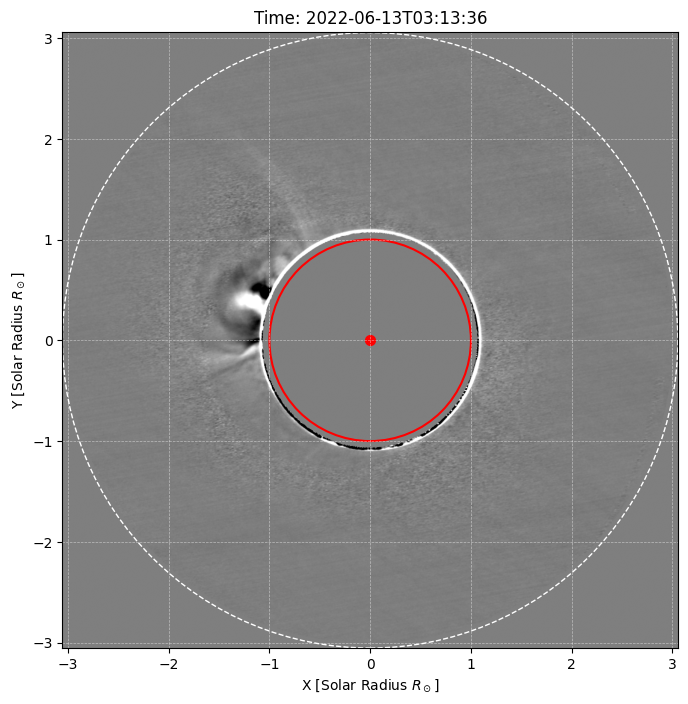

In [41]:

data, header = read_fits_file(fts_files[10])
fig, ax = plt.subplots(figsize=(8, 8))
draw_frame(data, header, ax)
plt.show()


### 動画

In [ ]:
if __name__ == '__main__':
    start_time = '2022-06-13 02:00'
    end_time = '2022-06-13 04:42'
    
    # 出力ファイル名を生成
    output_filename = f"mk4_movie2_{start_time.replace(':', '').replace(' ', '_')}_to_{end_time.replace(':', '').replace(' ', '_')}.mp4"
    output_path = os.path.join(output_folder, output_filename)
    
    
    # 修正した動画作成関数を呼び出し
    create_movie_from_fits_imageio(
        start_time_str=start_time,
        end_time_str=end_time,
        data_folder=data_folder,
        output_path=output_path,
        fps=5
    )

# SOHO/LASCO-C2

## 初期設定・関数

In [1]:
import matplotlib.pyplot as plt
import sunpy.map
from sunpy.coordinates import get_horizons_coord
from sunpy.sun import constants
from astropy.visualization import AsinhStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import numpy as np
import astropy.units as u
from pathlib import Path
from tqdm import tqdm
import imageio.v2 as imageio
import io
from astropy.time import Time


# create_corrected_lasco_map関数は変更なく、そのまま使用します
def create_corrected_lasco_map(filepath: str | Path) -> sunpy.map.Map:
    """SOHO/LASCOのFITSファイルを読み込み、観測者位置と太陽視半径を補正したMapを生成"""
    print(f"'{Path(filepath).name}' を読み込んでいます...")
    lasco_map_raw = sunpy.map.Map(filepath)
    print("SOHOの正確な位置をJPL HORIZONSから取得中...")
    observer_coord = get_horizons_coord('SOHO', lasco_map_raw.date)
    new_meta = lasco_map_raw.meta.copy()
    new_meta['hgln_obs'] = observer_coord.lon.value
    new_meta['hglt_obs'] = observer_coord.lat.value
    dsun_obs = observer_coord.radius
    new_meta['dsun_obs'] = dsun_obs.to('m').value
    rsun_physical = constants.get('radius')
    rsun_arc = np.arctan(rsun_physical / dsun_obs).to(u.arcsec).value
    new_meta['rsun_arc'] = rsun_arc
    print("メタデータの補正が完了しました。")
    corrected_map = sunpy.map.Map(lasco_map_raw.data, new_meta)
    return corrected_map


# ★★★ ここからがシンプルに書き換えた描画関数 ★★★
def plot_lasco_with_integer_contours(lasco_map: sunpy.map.Map, ax=None, show_grid: bool = True):
    """
    Mapオブジェクトをプロットし、太陽半径の整数倍の等高線を描画する。

    Args:
        lasco_map (sunpy.map.Map): プロットするMapオブジェクト。
        ax (matplotlib.axes.Axes, optional): プロット先のAxes。指定しない場合は新規作成する。
        show_grid (bool, optional): 背景の直交グリッドを表示するかどうか。
    """
    if ax is None:
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(1, 1, 1, projection=lasco_map)

    # 輝度のノーマライゼーション
    norm = ImageNormalize(
        vmin=np.percentile(lasco_map.data, 0.1),
        vmax=np.percentile(lasco_map.data, 99.9),
        stretch=AsinhStretch(a=0.1)
    )

    # LASCO画像のプロット
    lasco_map.plot(axes=ax, cmap='sdoaia304', norm=norm, annotate=False)
    
    # 太陽本体のリムを描画 (1R☉)
    lasco_map.draw_limb(axes=ax, color='white', linestyle='solid', linewidth=1)
    
    # --- 等高線描画のための準備 ---
    # 1. 各ピクセルの座標グリッドから半径マップを生成 (単位: R_sun)
    x, y = np.meshgrid(*[np.arange(v.value) for v in lasco_map.dimensions]) * u.pix
    coords = lasco_map.pixel_to_world(x, y)
    rsun_arcsecs = lasco_map.meta['rsun_arc']
    radius_map = np.sqrt(coords.Tx**2 + coords.Ty**2) / (rsun_arcsecs * u.arcsec)
    
    # --- 等高線の描画 ---
    # 画像に収まる最大の整数半径まで、2R☉から等高線を引く
    max_radius = 6
    int_levels = np.arange(2, max_radius + 1)
    
    if len(int_levels) > 0:
        ax.contour(radius_map.value, levels=int_levels, colors='white', 
                   linewidths=1, linestyles='--', alpha=0.7)

    # 太陽中心のマーカー
    ax.plot(0, 0, '+', color='yellow', markersize=12, markeredgewidth=1.5,
            transform=ax.get_transform('world'))

    # 背景グリッドと軸ラベル、タイトル
    ax.grid(show_grid, color='white', linestyle=':', alpha=0.5)
    ax.set_xlabel('Solar-X (arcsec)')
    ax.set_ylabel('Solar-Y (arcsec)')
    ax.set_title(f'SOHO/LASCO-C2 | {lasco_map.date.iso}')
    
    
def find_files_in_time_range(directory: Path, start_time: str, end_time: str) -> list[Path]:
    """
    指定されたディレクトリと時間範囲に一致するFITSファイルのリストを返す。
    sunpy.map.Mapを使って確実に時刻を取得する。
    """
    print(f"ディレクトリ '{directory}' 内の.ftsファイルを検索しています...")
    all_files = sorted(directory.glob('*.fts'))
    
    t_start = Time(start_time)
    t_end = Time(end_time)
    
    filtered_files = []
    print("各ファイルを読み込み、時間範囲内か確認しています（時間がかかる場合があります）...")
    for f in tqdm(all_files, desc="ファイルフィルタリング"):
        try:
            # ★★★ 修正箇所: sunpy.map.Mapでファイル全体を読み込む ★★★
            m = sunpy.map.Map(f)
            # .date属性から直接、正確な時刻（Timeオブジェクト）を取得
            file_time = m.date
            
            if t_start <= file_time <= t_end:
                filtered_files.append(f)
        except Exception as e:
            # 読み込みに失敗したファイルはスキップ
            print(f"ファイル {f.name} の読み込み/解析中にエラー: {e}")
            continue
            
    return filtered_files


def plot_difference_map(diff_map: sunpy.map.Map, base_map_date: Time, ax=None, show_grid: bool = True):
    """
    差分Mapオブジェクトをプロットする。カラーマップやノーマライゼーションは差分表示に最適化。
    """
    if ax is None:
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(1, 1, 1, projection=diff_map)

    # 差分データ用のノーマライゼーション（ゼロ中心で対称）
    vmax = np.percentile(np.abs(diff_map.data), 99.5) # 99.5%点の絶対値を取得
    norm = ImageNormalize(vmin=-vmax, vmax=vmax)

    # 差分画像なので、発散するカラーマップ（'gray'や'bwr'など）が適している
    diff_map.plot(axes=ax, cmap='gray', norm=norm, annotate=False)
    
    # 太陽本体のリムと等高線は空間的な参照のために描画する
    diff_map.draw_limb(axes=ax, color='lime', linestyle='solid', linewidth=1)
    
    x, y = np.meshgrid(*[np.arange(v.value) for v in diff_map.dimensions]) * u.pix
    coords = diff_map.pixel_to_world(x, y)
    rsun_arcsecs = diff_map.meta['rsun_arc']
    radius_map = np.sqrt(coords.Tx**2 + coords.Ty**2) / (rsun_arcsecs * u.arcsec)
    
    max_radius = 6
    int_levels = np.arange(2, max_radius + 1)
    
    if len(int_levels) > 0:
        ax.contour(radius_map.value, levels=int_levels, colors='lime', 
                   linewidths=1, linestyles='--', alpha=0.5)

    ax.plot(0, 0, '+', color='yellow', markersize=12, markeredgewidth=1.5,
            transform=ax.get_transform('world'))

    ax.grid(show_grid, color='white', linestyle=':', alpha=0.5)
    ax.set_xlabel('Solar-X (arcsec)')
    ax.set_ylabel('Solar-Y (arcsec)')
    
    # タイトルに差分元と差分先の時刻を両方表示する
    time_delta_minutes = (diff_map.date - base_map_date).to(u.min).value
    ax.set_title(
        f'SOHO/LASCO-C2 (Running Difference)\n'
        f'{base_map_date.strftime("%Y-%m-%d %H:%M:%S")} - {diff_map.date.strftime("%Y-%m-%d %H:%M:%S")}'
    )

def create_lasco_movie(file_list: list[Path], output_path: Path, fps: int):
    """ファイルリストからフレームを生成し、動画ファイルとして保存する"""
    frames = []
    print("各フレームをメモリ上にレンダリングしています...")
    for filepath in tqdm(file_list, desc="フレーム生成"):
        try:
            # create_corrected_lasco_mapは重いので、フィルタリングで読み込んだMapを再利用したいが、
            # 現状のコード構成では、ここで再度読み込む必要がある。
            current_map = create_corrected_lasco_map(filepath)
            fig = plt.figure(figsize=(8, 8))
            ax = fig.add_subplot(1, 1, 1, projection=current_map)
            plot_lasco_with_integer_contours(current_map, ax, show_grid=False)
            
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=150)
            buf.seek(0)
            image_from_plot = imageio.imread(buf)
            buf.close()
            
            frames.append(image_from_plot)
            plt.close(fig)
        except Exception as e:
            print(f"ファイル {filepath.name} の処理中にエラーが発生しました: {e}")
            plt.close('all')
            continue

    if not frames:
        print("有効なフレームが生成されなかったため、動画は作成されませんでした。")
        return

    print(f"\n全{len(frames)}フレームをレンダリングしました。動画に変換します...")
    try:
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")
        
        
def create_lasco_running_difference_movie(file_list: list[Path], output_path: Path, fps: int):
    """
    ファイルリストからランニング・ディファレンス（差分）画像を生成し、動画として保存する。
    """
    if len(file_list) < 2:
        print("差分動画を作成するには少なくとも2つのファイルが必要です。")
        return
        
    frames = []
    print("連続するフレーム間の差分を計算し、レンダリングしています...")
    
    # 差分を取るため、ループは(リストの長さ - 1)回実行する
    for i in tqdm(range(len(file_list) - 1), desc="差分フレーム生成"):
        filepath_i = file_list[i]
        filepath_i_plus_1 = file_list[i+1]
        
        try:
            # 連続する2つの時刻のマップを読み込む
            map_i = create_corrected_lasco_map(filepath_i)
            map_i_plus_1 = create_corrected_lasco_map(filepath_i_plus_1)

            # データ配列の差分を計算
            # メタデータは後の時刻のものを引き継ぐ
            diff_data = map_i_plus_1.data - map_i.data
            diff_map = sunpy.map.Map(diff_data, map_i_plus_1.meta)
            
            # 差分マップをプロット
            fig = plt.figure(figsize=(8, 8))
            ax = fig.add_subplot(1, 1, 1, projection=diff_map)
            plot_difference_map(diff_map, base_map_date=map_i.date, ax=ax, show_grid=False)
            
            # プロットした画像をメモリ上のバッファに保存
            buf = io.BytesIO()
            plt.savefig(buf, format='png', dpi=150)
            buf.seek(0)
            frames.append(imageio.imread(buf))
            buf.close()
            plt.close(fig)

        except Exception as e:
            print(f"ファイル {filepath_i.name} と {filepath_i_plus_1.name} の処理中にエラー: {e}")
            plt.close('all') # エラー時に開いているFigureをすべて閉じる
            continue

    if not frames:
        print("有効なフレームが生成されなかったため、動画は作成されませんでした。")
        return

    print(f"\n全{len(frames)}フレームの差分画像をレンダリングしました。動画に変換します...")
    try:
        imageio.mimwrite(output_path, frames, fps=fps, codec='libx264', quality=8)
        print(f"\n動画ファイル '{output_path}' が正常に作成されました。")
    except Exception as e:
        print(f"\n動画の保存中にエラーが発生しました: {e}")



d:\wsl\home\kinno-7010\Research\.venv-win\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## plot

In [ ]:
if __name__ == '__main__':
    # --- 1. パラメータ設定 ---
    START_TIME = '2022-06-13T02:00:00'
    END_TIME   = '2022-06-13T04:30:00'
    
    # 注意: パスはご自身の環境に合わせて修正してください
    BASE_DIR = Path(r'D:\wsl\home\kinno-7010\Research\SOHO\LASCO-C2_rawdata')
    OUTPUT_DIR = Path(r'D:\wsl\home\kinno-7010\Research\SOHO\output')

    # --- 2. ファイルの検索 ---
    files_to_process = find_files_in_time_range(BASE_DIR, START_TIME, END_TIME)
    
    # --- 3. 動画の作成 ---
    if files_to_process:
        print(f"時間範囲({START_TIME} - {END_TIME})に一致した {len(files_to_process)}個のファイルで動画を作成します。")

        # --- 3b. 差分動画を作成する場合 (新規) ---
        diff_output_filename_str = f"lasco_c2_running_difference_{Time(START_TIME).strftime('%Y%m%d_%H%M%S')}-{Time(END_TIME).strftime('%H%M%S')}.mp4"
        OUTPUT_PATH_DIFF = OUTPUT_DIR / diff_output_filename_str
        create_lasco_running_difference_movie(files_to_process, OUTPUT_PATH_DIFF, FRAME_RATE)

    else:
        print("指定された時間範囲に該当するファイルは見つかりませんでした。")

# 統合

## 初期設定・関数

In [31]:
import logging
import numpy as np
import matplotlib.pyplot as plt
# まず SunPy 本体をインポート
import sunpy.map
import sunpy

from sunpy.coordinates import get_horizons_coord
from sunpy.sun import constants as sunpy_constants
from datetime import datetime
from pathlib import Path
from matplotlib.colors import Normalize
from scipy.ndimage import map_coordinates
from astropy.time import Time
from astropy import units as u
from tqdm import tqdm
import warnings
from astropy.io.fits import file as fits_file

import os, gc, io
import imageio
from astropy.visualization import ImageNormalize, LogStretch
import bisect
from reproject import reproject_interp
# 処理中に発生した問題を記録するためのロギング設定
from typing import Union
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor, as_completed
from astropy.io import fits
from scipy.ndimage import rotate
logging.getLogger('sunpy.map.mapbase').setLevel(logging.WARNING)
logging.getLogger('sunpy').setLevel(logging.WARNING)
logging.getLogger('reproject').setLevel(logging.WARNING)
logging.getLogger('reproject.mosaicking').setLevel(logging.WARNING)
warnings.filterwarnings(
    "ignore",
    message="Could not memory map array.*",
    category=UserWarning,
    module=fits_file.__name__
)
logging.basicConfig(level=logging.WARNING, format='%(asctime)s - %(levelname)s - %(message)s')

data_folder_dict = {'mk4': r'D:\wsl\home\kinno-7010\Research\MK4_coronagraph\MK4_coronagraph_KCOR\Subtraction_data\Rawdata\kcor_nrgf\20220613.kcor_nrgf.fits',
                'lasco': r'D:\wsl\home\kinno-7010\Research\SOHO\LASCO-C2_rawdata',
                'aia211': r'D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata\211',
                'aia193': r'D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata\193',
                'aia171': r'D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata\171' }
mk4_dir, lasco_dir, aia211_dir, aia193_dir, aia171_dir = data_folder_dict.values()
# =============================================================================
# STEP 1: データ統合とプロット関数
# =============================================================================
def get_data_list(scan_start, scan_end):
        # データリスト取得    
    map_lists_dict = {}
    for key, value in data_folder_dict.items():
        map_lists_dict[key] = scan_directory_for_maps(Path(value), scan_start.iso, scan_end.iso)
    
    if not all(map_lists_dict.values()):
        raise FileNotFoundError("指定範囲に必要なデータが揃っていません。")
    
    mk4_list, lasco_list, aia211_list, aia193_list, aia171_list = map_lists_dict.values()
    return mk4_list, lasco_list, aia211_list, aia193_list, aia171_list
    

def create_fully_corrected_lasco_map(source: Union[str, Path, sunpy.map.Map]) -> sunpy.map.Map:
    """
    SOHO/LASCOのFITSファイルまたはMapオブジェクトを読み込み、輝度、角度、
    観測者位置、太陽視半径をすべて補正したSunPy Mapオブジェクトを生成する。
    """
    ### ▼▼▼ 変更点：チェック対象を sunpy.map.Map から sunpy.map.GenericMap に変更します ▼▼▼
    if isinstance(source, sunpy.map.GenericMap):
        raw_map = source
    else:
        raw_map = sunpy.map.Map(source)

    # --- 以降の関数の本体は変更ありません ---
    observer_coord = get_horizons_coord('SOHO', raw_map.date)
    new_meta = raw_map.meta.copy()
    
    new_meta['hgln_obs'] = observer_coord.lon.value
    new_meta['hglt_obs'] = observer_coord.lat.value
    dsun_obs = observer_coord.radius
    new_meta['dsun_obs'] = dsun_obs.to('m').value

    rsun_physical = sunpy_constants.get('radius')
    rsun_arc = np.arctan(rsun_physical / dsun_obs).to(u.arcsec).value
    new_meta['rsun_arc'] = rsun_arc

    exposure_time = new_meta.get('EXPTIME')
    if exposure_time and exposure_time > 0:
        normalized_data = raw_map.data.astype(np.float64) / exposure_time
        new_meta['BUNIT'] = 'DN / s'
    else:
        normalized_data = raw_map.data.astype(np.float64)

    intermediate_map = sunpy.map.Map(normalized_data, new_meta)
    final_map = intermediate_map.rotate(missing=0.0)
    
    return final_map

def combine_corona_data(data_lasco, params_lasco,
                        data_mk4, params_mk4,
                        data_aia, params_aia,
                        r_map, r_ranges):
    """
    AIA, Mk4, LASCO データを同一ラスコグリッド上で補間・マスクし、
    連続画像を返す。（修正版）
    """

    # 補間対象の画像データとパラメータを辞書にまとめます。
    # 処理の基準となるLASCOのデータは、このループに含める必要はありません。
    data_to_interp = {'mk4': data_mk4, 'aia': data_aia}
    params_to_interp = {'mk4': params_mk4, 'aia': params_aia}
    
    # 基準となるLASCOグリッドの座標を計算
    ny, nx = params_lasco['ny'], params_lasco['nx']
    y_idx, x_idx = np.indices((ny, nx))
    
    # LASCOグリッドの各点が、太陽中心からどのくらい離れているかを正規化して表現
    x_norm_on_lasco_grid = (x_idx - params_lasco['cx']) / params_lasco['px_per_rsun']
    y_norm_on_lasco_grid = (y_idx - params_lasco['cy']) / params_lasco['px_per_rsun']

    # 補間後のデータを格納するための辞書
    interp_dict = {}
    
    # MK4とAIAのデータを、LASCOのグリッドに合わせて補間するループ
    for key in data_to_interp.keys():
        data = data_to_interp[key]
        params = params_to_interp[key]
        
        # LASCOグリッド上の各点が、現在のデータ(AIAやMK4)のどのピクセル座標に対応するかを計算
        coords_in_source_image = np.vstack([
            (y_norm_on_lasco_grid * params['px_per_rsun'] + params['cy']).ravel(),
            (x_norm_on_lasco_grid * params['px_per_rsun'] + params['cx']).ravel()
        ])
        
        # 入力データが有効かチェック
        if not isinstance(data, np.ndarray) or data.ndim < 2:
             raise ValueError(f"'{key}' の画像データが有効なNumpy配列ではありません。")

        # ★★★ ここが最も重要な修正点 ★★★
        # map_coordinatesに「画像データ(data)」と「座標」を渡して補間を実行します。
        interp_data = map_coordinates(data, coords_in_source_image, order=1, mode='constant', cval=np.nan)
        
        # 結果を元のLASCOグリッドの形状に戻し、辞書に保存
        interp_dict[key] = interp_data.reshape((ny, nx))

    # 辞書から補間済みのデータを取り出す
    interp_aia = interp_dict['aia']
    interp_mk4 = interp_dict['mk4']

    # 各領域に対応するマスクを定義
    mask_aia = (r_map >= 0) & (r_map < r_ranges['mk4_inner'])
    mask_mk4 = (r_map >= r_ranges['mk4_inner']) & (r_map < r_ranges['mk4_outer_lasco_inner'])
    mask_lasco = (r_map >= r_ranges['mk4_outer_lasco_inner']) & (r_map <= r_ranges['lasco_outer'])

    # 各マスク領域に、対応するデータを貼り付けて1枚の画像を合成
    composite = np.full_like(data_lasco, np.nan)
    composite[mask_aia]   = interp_aia[mask_aia]
    composite[mask_mk4]  = interp_mk4[mask_mk4]
    composite[mask_lasco] = data_lasco[mask_lasco]  # LASCOは基準なので、元のデータをそのまま使用

    return composite, interp_mk4, interp_aia

def calculate_r_map(params):
    """
    params: dict with keys 'nx','ny','cx','cy','px_per_rsun'
    returns: 2D array of shape (ny, nx) giving radius in R_sun units
    """
    ny, nx = params['ny'], params['nx']
    # pixel indices
    y_idx, x_idx = np.indices((ny, nx))
    # normalized coordinates [R_sun]
    x_norm = (x_idx - params['cx']) / params['px_per_rsun']
    y_norm = (y_idx - params['cy']) / params['px_per_rsun']
    # radius map
    return np.sqrt(x_norm**2 + y_norm**2)


# =============================================================================
# STEP 2: ファイル検索
# =============================================================================
def _process_file(file_path: Path, start_time: Time, end_time: Time):
    """
    単一のファイルを処理するためのヘルパー関数（HDU構造に対応した最終版）。
    """
    try:
        if not file_path.is_file():
            return None

        # 【対策】まずHDU 1(2番目の箱)のヘッダー取得を試みる
        # SDO/AIA等の圧縮FITSは、主要情報がHDU 1にあることが多いため。
        try:
            header = fits.getheader(file_path, ext=1)
        except IndexError:
            # HDU 1 が存在しないファイル(非圧縮FITS等)の場合は、HDU 0(1番目の箱)にフォールバックする
            logging.debug(f"HDU 1 が見つかりません。HDU 0 を試します: {file_path}")
            header = fits.getheader(file_path, ext=0)
        
        # --- これ以降の時刻キー検索ロジックは前回と同じ ---
        datetime_str = None
        date_key_candidates = ['DATE-OBS', 'DATE_OBS', 'DATE']
        for key in date_key_candidates:
            if key in header:
                datetime_str = header[key]
                break

        if not datetime_str:
            logging.warning(f"日付キー {date_key_candidates} がどのHDUにも見つかりません: {file_path}")
            return None

        if 'TIME-OBS' in header:
            date_part = datetime_str.split('T')[0]
            time_part = header['TIME-OBS']
            datetime_str = f"{date_part.replace('/', '-')}T{time_part}"
        
        file_time = Time(datetime_str)
        
        if start_time <= file_time <= end_time:
            m = sunpy.map.Map(file_path)
            return (m, file_path)

    except ValueError as e:
        logging.warning(f"時刻文字列 '{datetime_str}' の解釈に失敗しました {file_path}: {e}")
        return None
    except Exception as e:
        logging.warning(f"ファイルの処理に失敗しました {file_path}: {e}")
        return None
        
    return None


def scan_directory_for_maps(directory: Path, start_time_iso: str, end_time_iso: str, max_workers: int = None) -> list:
    """
    並列処理を用いて超高速化したスキャン関数。（この関数自体に変更はありません）
    """
    # (この関数の内容は変更ありません)
    if not directory.is_dir():
        return []

    t0 = Time(start_time_iso)
    t1 = Time(end_time_iso)
    
    files = list(directory.rglob('*.fits')) + list(directory.rglob('*.fts'))
    
    maps_with_paths = []
    
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        future_to_file = {executor.submit(_process_file, f, t0, t1): f for f in files}
        
        gen = as_completed(future_to_file)
        for future in tqdm(gen, total=len(files), desc=f"Scanning {directory.name}"):
            result = future.result()
            if result is not None:
                maps_with_paths.append(result)

    maps_with_paths.sort(key=lambda x: x[0].date)
    
    return maps_with_paths


def determine_aia_ranges(start_time_str: str, end_time_str: str, base_time_str: str, percentile_range=[1, 99.9]):
    """
    指定された期間のデータから、3つのAIA波長を統合した差分画像の
    最適なグレースケール表示範囲(vmin, vmax)を自動で決定する。
    """
    print("最適なAIAグレースケール表示範囲を計算中...")
    base_time_obj = Time(base_time_str)
    
    # 解析期間全体のデータリストを取得
    aia_dir = r"D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata"
    aia_lists = {
        '211': scan_directory_for_maps(Path(aia_dir)/'211', start_time_str, end_time_str),
        '193': scan_directory_for_maps(Path(aia_dir)/'193', start_time_str, end_time_str),
        '171': scan_directory_for_maps(Path(aia_dir)/'171', start_time_str, end_time_str)
    }

    # 全ての差分画像の輝度値を格納するリスト
    all_combined = []

    for wl, map_list in aia_lists.items():
        if not map_list:
            print(f"警告: {wl}Å のデータが見つかりません。スキップします。")

        
        for aia_map, _ in tqdm(map_list, desc=f"AIA {wl}Å diffs"):
            all_combined.append(aia_map.data.ravel())

    if not all_combined:
        raise ValueError("計算対象となるAIAデータが一つも見つかりませんでした。")

    # ★★★ 修正ポイント ★★★
    # 3波長の全データを結合してから、パーセンタイルを一度だけ計算する
    all_array = np.concatenate(all_combined)
    vmin, vmax = np.percentile(all_array, percentile_range)

    # 以前の辞書ではなく、(vmin, vmax) のタプルを返す
    ranges = (vmin, vmax)
    
    print("計算完了:", ranges)
    return ranges

def create_single_integrated_image(ax, target_time_str: str):
    out_dir_str = r"D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\diff"
    # --- 1. 時刻パースとデータリスト取得 (変更なし) ---
    target_time_obj = Time(target_time_str)
    scan_start = target_time_obj - 20*u.min
    scan_end = target_time_obj + 20*u.min
    out_dir = Path(out_dir_str)
        
    
    aia_norm_ranges = determine_aia_ranges(scan_start.iso, scan_end.iso, target_time_str, percentile_range=[1, 99.9])

    # データリスト取得
    mk4_list, lasco_list, aia211_list, aia193_list, aia171_list = get_data_list(scan_start, scan_end)
    data_dict = {'mk4': mk4_list, 'lasco': lasco_list, 'aia211': aia211_list, 'aia193': aia193_list, 'aia171': aia171_list}

    # LASCO マップ全体を先に読み込み、最大の shape を特定
    lasco_maps = [sunpy.map.Map(path) for _, path in lasco_list]
    max_ny = max(m.data.shape[0] for m in lasco_maps)
    max_nx = max(m.data.shape[1] for m in lasco_maps)
    global_shape = (max_ny, max_nx)
    # 最大 shape のマップを基準に WCS を取得
    ref_map = next(m for m in lasco_maps if m.data.shape == global_shape)
    target_wcs = ref_map.wcs

    # グローバル extent 固定
    def get_params(m):
        px = m.rsun_obs.to_value(u.arcsec) / m.scale.axis1.to_value(u.arcsec/u.pix)
        return dict(nx=m.data.shape[1],
                   ny=m.data.shape[0],
                   cx=m.meta['crpix1']-1,
                   cy=m.meta['crpix2']-1,
                   px_per_rsun=px)

    p_glob = get_params(ref_map)
    extent_global = [
        -p_glob['cx'], p_glob['nx'] - p_glob['cx'],
        -p_glob['cy'], p_glob['ny'] - p_glob['cy']
    ]

    # フレームごとに処理
    def resample_map(m):
        try:
            return m.resample(global_shape * u.pix)
        except AttributeError:
            data, _ = reproject_interp((m.data, m.wcs), target_wcs, global_shape)
            return sunpy.map.Map(data, ref_map.meta)
        
    data_selected_dict, data_dict_resampled, p_dict = {}, {}, {}
    # 各波長・Instrument のマップ取得
    for key, value in data_dict.items():
        data_selected_dict[key], _ = select_by_midpoint(target_time_obj, value)
        
        if key == 'lasco':
            print(f"INFO: Processing full correction for LASCO target map ({data_selected_dict[key].date})...")
            data_selected_dict[key] = create_fully_corrected_lasco_map(data_selected_dict[key])
            
        data_dict_resampled[key] = resample_map(data_selected_dict[key])
        
        p_dict[key] = get_params(data_dict_resampled[key])
        
    mk4_map, lasco_map, aia211_map, aia193_map, aia171_map = data_dict_resampled.values()
    p_mk4, p_lasco, p_aia, _, _ = p_dict.values()

    # 正規化（Mk4 / LASCO）
    # mk4_map_mean, mk4_map_std = np.nanmean(mk4_map.data), np.nanstd(mk4_map.data)
    # mk4_vmin, mk4_vmax = mk4_map_mean, mk4_map_mean + 1*mk4_map_std
    mk4_vmin, mk4_vmax = -1, 4
    n_mk4 = np.clip((mk4_map.data - mk4_vmin) / (mk4_vmax - mk4_vmin), 0, 1)


    lasco_map_mean, lasco_map_std = np.nanmean(lasco_map.data), np.nanstd(lasco_map.data)
    lasco_vmin, lasco_vmax = lasco_map_mean, lasco_map_mean + 5*lasco_map_std
    print('lasco_vmin', lasco_vmin, 'lasco_vmax', lasco_vmax)
    # lasco_vmin, lasco_vmax = np.nanpercentile(lasco_map.data, [1, 99])
    lasco_vmin, lasco_vmax = 60, 380
    n_lasco = np.clip((lasco_map.data - lasco_vmin) / (lasco_vmax - lasco_vmin), 0, 1)

    # AIA RGB 合成用正規化
    def normalize_log_stretch(arr, vmin, vmax):
        arr_clip = np.maximum(arr, 1e-9)
        norm = ImageNormalize(arr_clip, vmin=vmin, vmax=vmax, stretch=LogStretch(), clip=True)
        return norm(arr_clip)

    def scale01(a):
        mn, mx = np.nanmin(a), np.nanmax(a)
        return (a - mn) / (mx - mn) if mx > mn else np.zeros_like(a)
    
    r_ch = normalize_log_stretch(aia211_map.data, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])
    g_ch = normalize_log_stretch(aia193_map.data, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])
    b_ch = normalize_log_stretch(aia171_map.data, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])

    r01, g01, b01 = map(scale01, (r_ch, g_ch, b_ch))

    rgb_image = np.stack([r01, g01, b01], axis=-1)

    # 半径マップ・合成
    r_map = calculate_r_map(p_lasco)
    ranges = dict(mk4_inner=1.1, mk4_outer_lasco_inner=3, lasco_outer=6.0)
    composite, imk4, ia = combine_corona_data(
        n_lasco, p_lasco,
        n_mk4, p_mk4,
        rgb_image[...,0], p_aia,  # dummy for combine
        r_map, ranges
    )
    # MK4/LASCO 合成
    mask_mk4 = (r_map >= ranges['mk4_inner']) & (r_map < ranges['mk4_outer_lasco_inner'])
    mask_lasco = (r_map >= ranges['mk4_outer_lasco_inner']) & (r_map <= ranges['lasco_outer'])
    combined_ml = np.full_like(composite, np.nan)
    combined_ml[mask_mk4] = imk4[mask_mk4]
    combined_ml[mask_lasco] = n_lasco[mask_lasco]

    # ──────────────── 描画 ────────────────
    # fig, ax = plt.subplots(figsize=(6, 10))

    # 1) AIA RGB を RGBA に変換
    ny, nx = p_lasco['ny'], p_lasco['nx']
    y_idx, x_idx = np.indices((ny, nx))
    x_norm = (x_idx - p_lasco['cx']) / p_lasco['px_per_rsun']
    y_norm = (y_idx - p_lasco['cy']) / p_lasco['px_per_rsun']
    coords = np.vstack([
        (y_norm * p_aia['px_per_rsun'] + p_aia['cy']).ravel(),
        (x_norm * p_aia['px_per_rsun'] + p_aia['cx']).ravel()
    ])
    
    color_list = []
    for i_ch in [r_ch, g_ch, b_ch]:
        color_list.append(map_coordinates(i_ch, coords, order=1, mode='constant', cval=np.nan).reshape((ny, nx)))
    color_list.append((r_map < ranges['mk4_inner']).astype(float))
    rgba = np.stack(color_list, axis=-1)

    # 背景 AIA
    ax.imshow(rgba, origin='lower', extent=extent_global, aspect='equal', zorder=0)
    ax.imshow(combined_ml, origin='lower', cmap=plt.cm.plasma,
             norm=Normalize(0,1), extent=extent_global, alpha=0.7, zorder=1)

    # 境界円
    scale = p_lasco['px_per_rsun']
    theta = np.linspace(0, 2*np.pi, 400)
    for i in range(2, int(ranges['lasco_outer'])+1):
        ax.plot(p_lasco['px_per_rsun']*i*np.cos(theta),
                p_lasco['px_per_rsun']*i*np.sin(theta),
                ':', color='white', linewidth=0.8)

    # 境界円＆凡例
    r1 = ranges['mk4_inner']*scale
    ax.plot(r1*np.cos(theta), r1*np.sin(theta),
            '--',color='yellow',linewidth=1.5,
            label=f"{ranges['mk4_inner']} $R_\\odot$")
    r2 = ranges['mk4_outer_lasco_inner']*scale
    ax.plot(r2*np.cos(theta), r2*np.sin(theta),
            '--',color='cyan',linewidth=1.5,
            label=f"{ranges['mk4_outer_lasco_inner']} $R_\\odot$")

    # 軸範囲を global に固定
    ax.set_xlim(-400, 0); ax.set_ylim(-200, 300)
    # ax.set_xlabel('X [pixel]'); ax.set_ylabel('Y [pixel]'); ax.set_facecolor('gray')
    ax.set_title(
        f"SDO/AIA 211+193+171 Å: {aia211_map.date.strftime('%Y-%m-%d %H:%M:%S')}\n"
        f"Mk4: {mk4_map.date.strftime('%H:%M:%S')} | LASCO-C2: {lasco_map.date.strftime('%H:%M:%S')}"
    )
    ax.legend(loc='best')
    # plt.tight_layout()

    # safe_filename_time = target_time_str.replace(":", "-")
    # output_path = out_dir / f"diff_{safe_filename_time}.png"
    # fig.savefig(output_path, format='png', dpi=300)

    # print(f"Saved image to {output_path}")
    # plt.close(fig)
    

        
        
def select_by_midpoint(target_time: Time, map_list: list[tuple]):
    # map_list already sorted by m.date
    times = [m.date for m, _ in map_list]
    if len(times) == 1:
        return map_list[0]
    mids = []
    for i in range(len(times)-1):
        delta = times[i+1] - times[i]
        mids.append(times[i] + delta/2)
    idx = bisect.bisect_left(mids, target_time)
    return map_list[idx]

    
# AIA RGB 合成用正規化
def normalize_log_stretch(arr, vmin, vmax):
    arr_clip = np.maximum(arr, 1e-9)
    norm = ImageNormalize(arr_clip, vmin=vmin, vmax=vmax, stretch=LogStretch(), clip=True)
    return norm(arr_clip)

def get_params(m):
    px = m.rsun_obs.to_value(u.arcsec) / m.scale.axis1.to_value(u.arcsec/u.pix)
    return dict(nx=m.data.shape[1],
                ny=m.data.shape[0],
                cx=m.meta['crpix1']-1,
                cy=m.meta['crpix2']-1,
                px_per_rsun=px)

def scale01(a):
    mn, mx = np.nanmin(a), np.nanmax(a)
    return (a - mn) / (mx - mn) if mx > mn else np.zeros_like(a)


## normal plot

最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<00:00, 19873.51it/s]


計算完了: (np.float64(-0.125), np.float64(2779.8125))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 28.60it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:16:33,359 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123


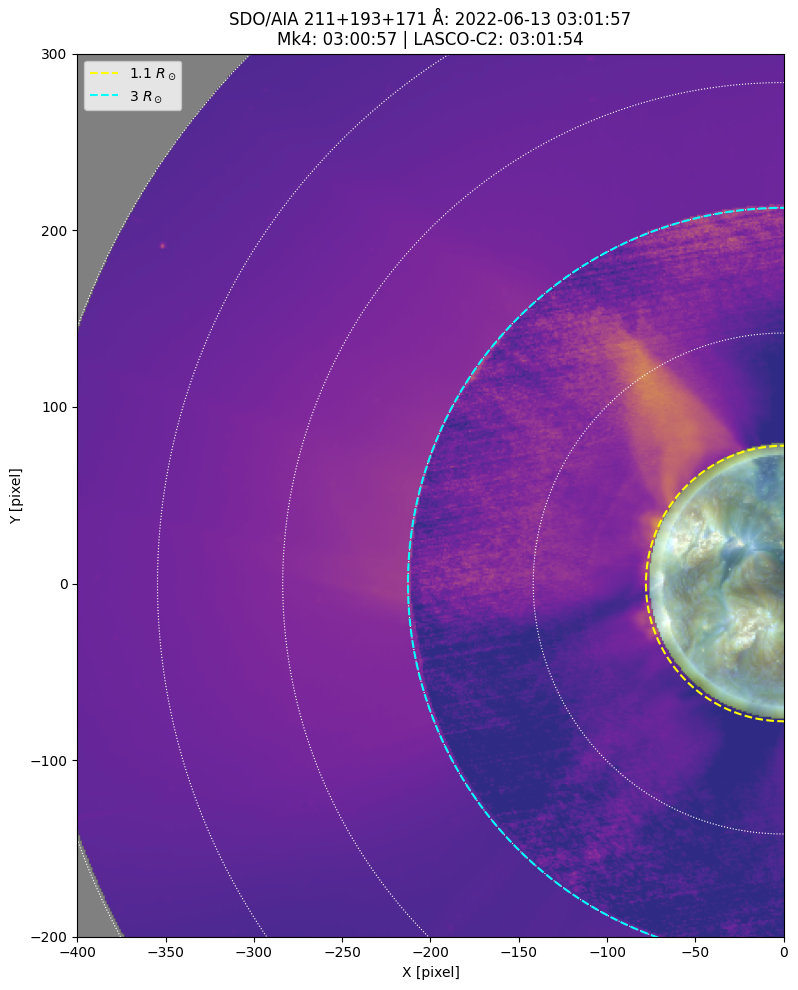

In [145]:
target_time = '2022-06-13T03:01:00'

fig, ax = plt.subplots(figsize=(10, 10), tight_layout=True)
create_single_integrated_image(ax, target_time)
plt.show()
plt.close(fig)

## diff

### 関数

In [32]:
def determine_aia_diff_ranges(start_time_str: str, end_time_str: str, base_time_str: str, percentile_range=[1, 99.9]):
    """
    指定された期間のデータから、3つのAIA波長を統合した差分画像の
    最適なグレースケール表示範囲(vmin, vmax)を自動で決定する。
    """
    print("最適なAIAグレースケール表示範囲を計算中...")
    base_time_obj = Time(base_time_str)
    
    # 解析期間全体のデータリストを取得
    aia_dir = r"D:\wsl\home\kinno-7010\Research\SDO\AIA\Rawdata"
    aia_lists = {
        '211': scan_directory_for_maps(Path(aia_dir)/'211', start_time_str, end_time_str),
        '193': scan_directory_for_maps(Path(aia_dir)/'193', start_time_str, end_time_str),
        '171': scan_directory_for_maps(Path(aia_dir)/'171', start_time_str, end_time_str)
    }

    # 全ての差分画像の輝度値を格納するリスト
    all_diffs_combined = []

    for wl, map_list in aia_lists.items():
        if not map_list:
            print(f"警告: {wl}Å のデータが見つかりません。スキップします。")
            continue
        
        base_map, _ = select_by_midpoint(base_time_obj, map_list)
        
        for aia_map, _ in tqdm(map_list, desc=f"AIA {wl}Å diffs"):
            diff = aia_map.data - base_map.data
            all_diffs_combined.append(diff.ravel())

    if not all_diffs_combined:
        raise ValueError("計算対象となるAIAデータが一つも見つかりませんでした。")

    # ★★★ 修正ポイント ★★★
    # 3波長の全データを結合してから、パーセンタイルを一度だけ計算する
    all_diffs_array = np.concatenate(all_diffs_combined)
    vmin, vmax = np.percentile(all_diffs_array, percentile_range)

    # 以前の辞書ではなく、(vmin, vmax) のタプルを返す
    ranges = (vmin, vmax)
    
    print("計算完了:", ranges)
    return ranges

def create_single_diff_image(ax, target_time_str: str):
    base_time_str = "2022-06-13T02:00:00"
    out_dir_str = r"D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\diff"
    # --- 1. 時刻パースとデータリスト取得 (変更なし) ---
    base_time_obj = Time(base_time_str)
    target_time_obj = Time(target_time_str)
    scan_start = min(target_time_obj, base_time_obj)
    scan_end = max(target_time_obj, base_time_obj)
    out_dir = Path(out_dir_str)
    
    aia_norm_ranges = determine_aia_diff_ranges(scan_start.iso, scan_end.iso, base_time_str, percentile_range=[1, 99.9])

    # データリスト取得
    mk4_list, lasco_list, aia211_list, aia193_list, aia171_list = get_data_list(scan_start, scan_end)
    data_dict = {'mk4': mk4_list, 'lasco': lasco_list, 'aia211': aia211_list, 'aia193': aia193_list, 'aia171': aia171_list}

    # LASCO マップ全体を先に読み込み、最大の shape を特定
    lasco_maps = [sunpy.map.Map(path) for _, path in lasco_list]
    max_ny = max(m.data.shape[0] for m in lasco_maps)
    max_nx = max(m.data.shape[1] for m in lasco_maps)
    global_shape = (max_ny, max_nx)
    # 最大 shape のマップを基準に WCS を取得
    ref_map = next(m for m in lasco_maps if m.data.shape == global_shape)
    target_wcs = ref_map.wcs

    # グローバル extent 固定
    def get_params(m):
        px = m.rsun_obs.to_value(u.arcsec) / m.scale.axis1.to_value(u.arcsec/u.pix)
        return dict(nx=m.data.shape[1],
                   ny=m.data.shape[0],
                   cx=m.meta['crpix1']-1,
                   cy=m.meta['crpix2']-1,
                   px_per_rsun=px)

    p_glob = get_params(ref_map)
    extent_global = [
        -p_glob['cx'], p_glob['nx'] - p_glob['cx'],
        -p_glob['cy'], p_glob['ny'] - p_glob['cy']
    ]

    # フレームごとに処理
    def resample_map(m):
        try:
            return m.resample(global_shape * u.pix)
        except AttributeError:
            data, _ = reproject_interp((m.data, m.wcs), target_wcs, global_shape)
            return sunpy.map.Map(data, ref_map.meta)
        
    data_selected_dict, data_selected_base_dict, data_dict_resampled, data_dict_base_resampled, p_dict, diff_dict = {}, {}, {}, {}, {}, {}
    # 各波長・Instrument のマップ取得
    for key, value in data_dict.items():
        data_selected_dict[key], _ = select_by_midpoint(target_time_obj, value)
        data_selected_base_dict[key], _ = select_by_midpoint(base_time_obj, value)
        
        if key == 'lasco':
            print(f"INFO: Processing full correction for LASCO target map ({data_selected_dict[key].date})...")
            data_selected_dict[key] = create_fully_corrected_lasco_map(data_selected_dict[key])
            
            print(f"INFO: Processing full correction for LASCO base map ({data_selected_base_dict[key].date})...")
            data_selected_base_dict[key] = create_fully_corrected_lasco_map(data_selected_base_dict[key])
            print("INFO: LASCO correction complete.")
            
        data_dict_resampled[key] = resample_map(data_selected_dict[key])
        data_dict_base_resampled[key] = resample_map(data_selected_base_dict[key])
        
        p_dict[key] = get_params(data_dict_resampled[key])
        diff_dict[key] = data_dict_resampled[key].data - data_dict_base_resampled[key].data
        
    mk4_map, lasco_map, aia211_map, _, _ = data_dict_resampled.values()
    p_mk4, p_lasco, p_aia, _, _ = p_dict.values()
    mk4_diff, lasco_diff, aia211_diff, aia193_diff, aia171_diff = diff_dict.values()

    # 正規化（Mk4 / LASCO）
    # mk4_map_mean, mk4_map_std = np.nanmean(mk4_map.data), np.nanstd(mk4_map.data)
    # mk4_vmin, mk4_vmax = mk4_map_mean - 2*mk4_map_std, mk4_map_mean
    mk4_vmin, mk4_vmax = np.percentile(mk4_diff, [0.1, 99.9])
    mk4_vmin, mk4_vmax = -2, 1.5
    print('mk4_vmin', mk4_vmin, 'mk4_vmax', mk4_vmax)
    n_mk4 = np.clip((mk4_diff - mk4_vmin) / (mk4_vmax - mk4_vmin), 0, 1)

    # lasco_map_mean, lasco_map_std = np.nanmean(lasco_map.data), np.nanstd(lasco_map.data)
    # lasco_vmin, lasco_vmax = lasco_map_mean - lasco_map_std, lasco_map_mean + lasco_map_std
    # lasco_vmin, lasco_vmax = np.percentile(lasco_diff, [1, 99.9])
    lasco_vmin, lasco_vmax = -5, 50
    print('lasco_vmin', lasco_vmin, 'lasco_vmax', lasco_vmax)
    
    n_lasco = np.clip((lasco_diff - lasco_vmin) / (lasco_vmax - lasco_vmin), 0, 1)

    # AIA RGB 合成用正規化
    def normalize_log_stretch(arr, vmin, vmax):
        arr_clip = np.maximum(arr, 1e-9)
        norm = ImageNormalize(arr_clip, vmin=vmin, vmax=vmax, stretch=LogStretch(), clip=True)
        return norm(arr_clip)

    def scale01(a):
        mn, mx = np.nanmin(a), np.nanmax(a)
        return (a - mn) / (mx - mn) if mx > mn else np.zeros_like(a)
    
    r_ch = normalize_log_stretch(aia211_diff, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])
    g_ch = normalize_log_stretch(aia193_diff, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])
    b_ch = normalize_log_stretch(aia171_diff, vmin=aia_norm_ranges[0], vmax=aia_norm_ranges[1])

    r01, g01, b01 = map(scale01, (r_ch, g_ch, b_ch))

    rgb_image = np.stack([r01, g01, b01], axis=-1)

    # 半径マップ・合成
    r_map = calculate_r_map(p_lasco)
    ranges = dict(mk4_inner=1.1, mk4_outer_lasco_inner=3, lasco_outer=6.0)
    composite, imk4, ia = combine_corona_data(
        n_lasco, p_lasco,
        n_mk4, p_mk4,
        rgb_image[...,0], p_aia,  # dummy for combine
        r_map, ranges
    )
    # MK4/LASCO 合成
    mask_mk4 = (r_map >= ranges['mk4_inner']) & (r_map < ranges['mk4_outer_lasco_inner'])
    mask_lasco = (r_map >= ranges['mk4_outer_lasco_inner']) & (r_map <= ranges['lasco_outer'])
    combined_ml = np.full_like(composite, np.nan)
    combined_ml[mask_mk4] = imk4[mask_mk4]
    combined_ml[mask_lasco] = n_lasco[mask_lasco]

    # ──────────────── 描画 ────────────────
    # fig, ax = plt.subplots(figsize=(6, 10))

    # 1) AIA RGB を RGBA に変換
    ny, nx = p_lasco['ny'], p_lasco['nx']
    y_idx, x_idx = np.indices((ny, nx))
    x_norm = (x_idx - p_lasco['cx']) / p_lasco['px_per_rsun']
    y_norm = (y_idx - p_lasco['cy']) / p_lasco['px_per_rsun']
    coords = np.vstack([
        (y_norm * p_aia['px_per_rsun'] + p_aia['cy']).ravel(),
        (x_norm * p_aia['px_per_rsun'] + p_aia['cx']).ravel()
    ])
    
    color_list = []
    for i_ch in [r_ch, g_ch, b_ch]:
        color_list.append(map_coordinates(i_ch, coords, order=1, mode='constant', cval=np.nan).reshape((ny, nx)))
    color_list.append((r_map < ranges['mk4_inner']).astype(float))
    rgba = np.stack(color_list, axis=-1)

    # 背景 AIA
    ax.imshow(rgba, origin='lower', extent=extent_global, cmap=plt.cm.seismic, aspect='equal', zorder=0)
    ax.imshow(combined_ml, origin='lower', cmap=plt.cm.seismic,
             norm=Normalize(0,1), extent=extent_global, alpha=0.7, zorder=1)

    # 境界円
    scale = p_lasco['px_per_rsun']
    theta = np.linspace(0, 2*np.pi, 400)
    for i in range(2, int(ranges['lasco_outer'])+1):
        ax.plot(p_lasco['px_per_rsun']*i*np.cos(theta),
                p_lasco['px_per_rsun']*i*np.sin(theta),
                ':', color='white', linewidth=0.8)

    # 境界円＆凡例
    r1 = ranges['mk4_inner']*scale
    ax.plot(r1*np.cos(theta), r1*np.sin(theta),
            '--',color='yellow',linewidth=1.5,
            label=f"{ranges['mk4_inner']} $R_\\odot$")
    r2 = ranges['mk4_outer_lasco_inner']*scale
    ax.plot(r2*np.cos(theta), r2*np.sin(theta),
            '--',color='cyan',linewidth=1.5,
            label=f"{ranges['mk4_outer_lasco_inner']} $R_\\odot$")

    # 軸範囲を global に固定
    ax.set_xlim(-400, 0); ax.set_ylim(-200, 300)
    # ax.set_xlabel('X [pixel]'); ax.set_ylabel('Y [pixel]'); ax.set_facecolor('gray')
    ax.set_title(
        f"Difference | Base: {base_time_str.replace('T', ' ')} \n"
        f"SDO/AIA 211+193+171 Å: {aia211_map.date.strftime('%Y-%m-%d %H:%M:%S')}\n"
        f"Mk4: {mk4_map.date.strftime('%H:%M:%S')} | LASCO-C2: {lasco_map.date.strftime('%H:%M:%S')}"
    )
    ax.legend(loc='best')
    # plt.tight_layout()

    # safe_filename_time = target_time_str.replace(":", "-")
    # output_path = out_dir / f"diff_{safe_filename_time}.png"
    # fig.savefig(output_path, format='png', dpi=300)

    # print(f"Saved image to {output_path}")
    # plt.close(fig)
    

### single plot

最適なAIAグレースケール表示範囲を計算中...


Scanning 193:  41%|████▏     | 38/92 [00:03<00:05,  9.89it/s]


KeyboardInterrupt: 

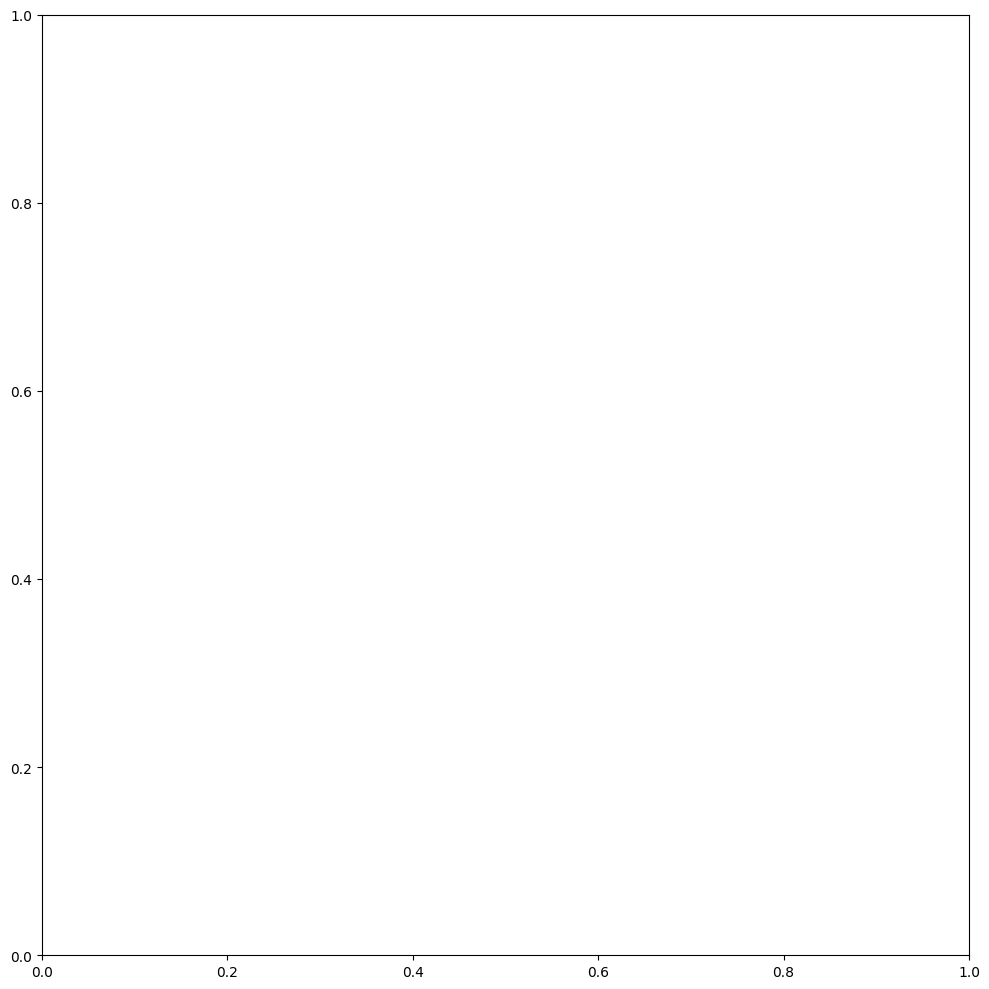

In [147]:
target_time = '2022-06-13T03:49:00'

fig, ax = plt.subplots(figsize=(10, 10), tight_layout=True)
create_single_diff_image(ax, target_time)
plt.show()
plt.close(fig)

### 2(normal+diff)×4(Time) plot

<string>:14: SyntaxWarning: invalid escape sequence '\{'
<>:14: SyntaxWarning: invalid escape sequence '\{'
<>:14: SyntaxWarning: invalid escape sequence '\w'
<string>:14: SyntaxWarning: invalid escape sequence '\{'
<>:14: SyntaxWarning: invalid escape sequence '\{'
<>:14: SyntaxWarning: invalid escape sequence '\w'
C:\Users\touho\AppData\Local\Temp\ipykernel_18164\3827335004.py:14: SyntaxWarning: invalid escape sequence '\{'
  fig.savefig(f'D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\{len(target_time_list)}images_{target_time_list[0]}_{target_time_list[-1]}.png', dpi=300)
C:\Users\touho\AppData\Local\Temp\ipykernel_18164\3827335004.py:14: SyntaxWarning: invalid escape sequence '\w'
  fig.savefig(f'D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\{len(target_time_list)}images_{target_time_list[0]}_{target_time_list[-1]}.png', dpi=300)


最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2779.8125))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 33.56it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:54:44,927 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 31/31 [00:00<00:00, 190.35it/s]


計算完了: (np.float64(-130.5625), np.float64(517.5))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 20.97it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:55:28,952 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2812.9375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 40.21it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:55:57,278 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:12:11.097)...
lasco_vmin 79.73684895667178 lasco_vmax 378.16422575355
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 37/37 [00:00<00:00, 221.86it/s]


計算完了: (np.float64(-147.0), np.float64(584.0625))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 21.13it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:56:38,531 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:12:11.097)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2860.0625))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 41.37it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:57:07,912 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:24:05.688)...
lasco_vmin 79.75730701983967 lasco_vmax 379.070609241553
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 43/43 [00:00<00:00, 221.59it/s]


計算完了: (np.float64(-163.125), np.float64(645.4375))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 18.49it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:57:56,483 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:24:05.688)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2881.4375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 38.58it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:58:25,593 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:36:05.479)...
lasco_vmin 80.19056258091821 lasco_vmax 384.13646773665084
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 49/49 [00:00<00:00, 196.58it/s]


計算完了: (np.float64(-179.5625), np.float64(706.75))


Scanning 171: 100%|██████████| 91/91 [00:06<00:00, 14.03it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:59:28,533 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:36:05.479)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2845.375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 43.01it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 17:59:57,840 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:48:06.671)...
lasco_vmin 80.94544210004659 lasco_vmax 391.11681801777405
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 55/55 [00:00<00:00, 225.00it/s]


計算完了: (np.float64(-195.8125), np.float64(764.5))


Scanning 171: 100%|██████████| 91/91 [00:06<00:00, 14.57it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:01:04,683 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:48:06.671)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2735.9375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 43.24it/s] 
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:01:33,898 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T04:00:05.462)...
lasco_vmin 81.70846077170116 lasco_vmax 394.9471775979494
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 61/61 [00:00<00:00, 193.38it/s]


計算完了: (np.float64(-212.25), np.float64(819.125))


Scanning 171: 100%|██████████| 91/91 [00:09<00:00,  9.43it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:02:57,828 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T04:00:05.462)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


C:\Users\touho\AppData\Local\Temp\ipykernel_18164\3827335004.py:14: SyntaxWarning: invalid escape sequence '\{'
  fig.savefig(f'D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\{len(target_time_list)}images_{target_time_list[0]}_{target_time_list[-1]}.png', dpi=300)
C:\Users\touho\AppData\Local\Temp\ipykernel_18164\3827335004.py:14: SyntaxWarning: invalid escape sequence '\w'
  fig.savefig(f'D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\{len(target_time_list)}images_{target_time_list[0]}_{target_time_list[-1]}.png', dpi=300)


OSError: [Errno 22] Invalid argument: 'D:\\wsl\\home\\kinno-7010\\Research\\SDO_Mk4_SOHO\\6images_2022-06-13T03:01:00_2022-06-13T04:01:00.png'

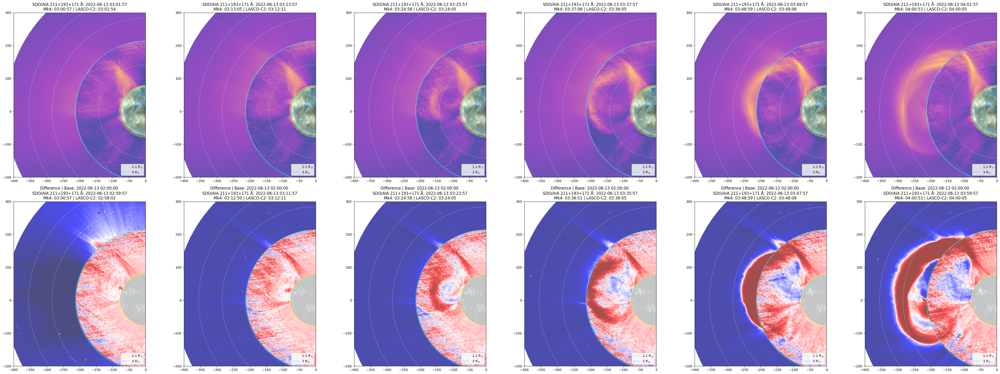

In [153]:
target_time_list = [
    '2022-06-13T03:01:00',
    '2022-06-13T03:13:00',
    '2022-06-13T03:25:00',
    '2022-06-13T03:37:00',
    '2022-06-13T03:49:00',
    '2022-06-13T04:01:00'
]

fig, ax = plt.subplots(2, 6, figsize=(46, 16), tight_layout=True)
for i, target_time in enumerate(target_time_list):
    create_single_integrated_image(ax[0, i], target_time_list[i])
    create_single_diff_image(ax[1, i], target_time_list[i])
fig.savefig(f'D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\{len(target_time_list)}images_{target_time_list[0]}_{target_time_list[-1]}.png', dpi=300)
plt.show()

## 動画化

### 初期設定・関数

In [3]:


# 必要な関数は既存定義とします:
# create_corrected_lasco_map, combine_corona_data, calculate_r_map, scan_directory_for_maps

def select_by_midpoint(target_time: Time, map_list: list[tuple]):
    # map_list already sorted by m.date
    times = [m.date for m, _ in map_list]
    if len(times) == 1:
        return map_list[0]
    mids = []
    for i in range(len(times)-1):
        delta = times[i+1] - times[i]
        mids.append(times[i] + delta/2)
    idx = bisect.bisect_left(mids, target_time)
    return map_list[idx]

def create_coronal_movie(start_time_str: str,
                         end_time_str: str,
                         mk4_dir: str,
                         lasco_dir: str,
                         aia_dir: str,
                         fps: int = 20):

    # データリスト取得
    mk4_list    = scan_directory_for_maps(Path(mk4_dir),   start_time_str, end_time_str)
    lasco_list  = scan_directory_for_maps(Path(lasco_dir), start_time_str, end_time_str)
    aia211_list = scan_directory_for_maps(Path(aia_dir)/'211', start_time_str, end_time_str)
    aia193_list = scan_directory_for_maps(Path(aia_dir)/'193', start_time_str, end_time_str)
    aia171_list = scan_directory_for_maps(Path(aia_dir)/'171', start_time_str, end_time_str)

    if not (mk4_list and lasco_list and aia211_list and aia193_list and aia171_list):
        raise FileNotFoundError("指定範囲に必要なデータが揃っていません。")

    # LASCO マップ全体を先に読み込み、最大の shape を特定
    lasco_maps = [sunpy.map.Map(path) for _, path in lasco_list]
    max_ny     = max(m.data.shape[0] for m in lasco_maps)
    max_nx     = max(m.data.shape[1] for m in lasco_maps)
    global_shape = (max_ny, max_nx)
    # 最大 shape のマップを基準に WCS を取得
    ref_map     = next(m for m in lasco_maps if m.data.shape == global_shape)
    target_wcs  = ref_map.wcs

    # グローバル extent 固定
    def get_params(m):
        px = m.rsun_obs.to_value(u.arcsec) / m.scale.axis1.to_value(u.arcsec/u.pix)
        return dict(nx=m.data.shape[1],
                    ny=m.data.shape[0],
                    cx=m.meta['crpix1']-1,
                    cy=m.meta['crpix2']-1,
                    px_per_rsun=px)

    p_glob      = get_params(ref_map)
    extent_global = [
        -p_glob['cx'], p_glob['nx'] - p_glob['cx'],
        -p_glob['cy'], p_glob['ny'] - p_glob['cy']
    ]

    # 出力先設定
    out_dir = Path(r"D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO")
    out_dir.mkdir(parents=True, exist_ok=True)
    sf = start_time_str.replace(":", "").replace("T","_")
    ef = end_time_str.replace(":", "").replace("T","_")
    out_file = out_dir / f"AIA_Mk4_LASCO_movie_{sf}_{ef}.mp4"

    writer = imageio.get_writer(
        str(out_file), fps=fps, codec='libx264',
        quality=8, macro_block_size=1
    )

    # フレームごとに処理
    for mk4_map, _ in tqdm(sorted(mk4_list, key=lambda x: x[0].date),
                            desc="Creating frames"):

        t0 = mk4_map.date

        # 各波長・Instrument のマップ取得
        lasco_map, _  = select_by_midpoint(t0, lasco_list)
        aia211_map, _ = select_by_midpoint(t0, aia211_list)
        aia193_map, _ = select_by_midpoint(t0, aia193_list)
        aia171_map, _ = select_by_midpoint(t0, aia171_list)

        # ──────────────── 全マップを global_shape にリサンプリング ────────────────
        def resample_map(m):
            try:
                return m.resample(global_shape * u.pix)
            except AttributeError:
                data, _ = reproject_interp((m.data, m.wcs), target_wcs, global_shape)
                return sunpy.map.Map(data, ref_map.meta)

        mk4_map    = resample_map(mk4_map)
        lasco_map  = resample_map(lasco_map)
        aia211_map = resample_map(aia211_map)
        aia193_map = resample_map(aia193_map)
        aia171_map = resample_map(aia171_map)
        # ──────────────── ここまで ────────────────

        # パラメータ取得 (global grid 上)
        p_mk4   = get_params(mk4_map)
        p_lasco = get_params(lasco_map)
        p_aia   = get_params(aia211_map)  # AIA 各波長は同じ grid 前提

        # 正規化（Mk4 / LASCO）
        mk4_vmin, mk4_vmax = -1, 3
        n_mk4   = np.clip((mk4_map.data - mk4_vmin) / (mk4_vmax - mk4_vmin), 0, 1)
        lv      = lasco_map.data[lasco_map.data > 0]
        lmin, lmax = np.percentile(lv, [1, 99])
        n_lasco = np.clip((lasco_map.data - lmin) / (lmax - lmin), 0, 1)

        # AIA RGB 合成用正規化
        def normalize_log_stretch(arr):
            arr_clip = np.maximum(arr, 1e-5)
            norm = ImageNormalize(arr_clip, stretch=LogStretch(), clip=True)
            return norm(arr_clip)
        r_ch = normalize_log_stretch(aia211_map.data)
        g_ch = normalize_log_stretch(aia193_map.data)
        b_ch = normalize_log_stretch(aia171_map.data)

        def scale01(a):
            mn, mx = np.nanmin(a), np.nanmax(a)
            return (a - mn) / (mx - mn) if mx > mn else np.zeros_like(a)
        r01, g01, b01 = map(scale01, (r_ch, g_ch, b_ch))
        rgb_image = np.stack([r01, g01, b01], axis=-1)

        # 半径マップ・合成
        r_map = calculate_r_map(p_lasco)
        ranges = dict(mk4_inner=1.1, mk4_outer_lasco_inner=3, lasco_outer=6.0)
        composite, imk4, ia = combine_corona_data(
            n_lasco, p_lasco,
            n_mk4,   p_mk4,
            rgb_image[...,0], p_aia,  # dummy for combine
            r_map, ranges
        )

        # ──────────────── 描画 ────────────────
        fig, ax = plt.subplots(figsize=(6, 10))

        # 1) AIA RGB を RGBA に変換
        ny, nx = p_lasco['ny'], p_lasco['nx']
        y_idx, x_idx = np.indices((ny, nx))
        x_norm = (x_idx - p_lasco['cx']) / p_lasco['px_per_rsun']
        y_norm = (y_idx - p_lasco['cy']) / p_lasco['px_per_rsun']
        coords = np.vstack([
            (y_norm * p_aia['px_per_rsun'] + p_aia['cy']).ravel(),
            (x_norm * p_aia['px_per_rsun'] + p_aia['cx']).ravel()
        ])
        r_i = map_coordinates(r_ch, coords, order=1, mode='constant', cval=np.nan).reshape((ny, nx))
        g_i = map_coordinates(g_ch, coords, order=1, mode='constant', cval=np.nan).reshape((ny, nx))
        b_i = map_coordinates(b_ch, coords, order=1, mode='constant', cval=np.nan).reshape((ny, nx))

        rgba = np.zeros((ny, nx, 4), dtype=np.float32)
        rgba[...,0] = r_i
        rgba[...,1] = g_i
        rgba[...,2] = b_i
        rgba[...,3] = (r_map < ranges['mk4_inner']).astype(float)

        # 背景 AIA
        ax.imshow(rgba, origin='lower', extent=extent_global, aspect='equal', zorder=0)

        # 境界円
        scale = p_lasco['px_per_rsun']
        theta = np.linspace(0, 2*np.pi, 400)
        for i in range(2, int(ranges['lasco_outer'])+1):
            ax.plot(p_glob['px_per_rsun']*i*np.cos(theta),
                    p_glob['px_per_rsun']*i*np.sin(theta),
                    ':', color='white', linewidth=0.8)
            
        # 境界円＆凡例
        r1 = ranges['mk4_inner']*scale
        ax.plot(r1*np.cos(theta), r1*np.sin(theta),
                '--',color='yellow',linewidth=1.5,
                label=f"{ranges['mk4_inner']} $R_\\odot$ (MK4)")
        r2 = ranges['mk4_outer_lasco_inner']*scale
        ax.plot(r2*np.cos(theta), r2*np.sin(theta),
                '--',color='cyan',linewidth=1.5,
                label=f"{ranges['mk4_outer_lasco_inner']} $R_\\odot$ (SOHO/LASCO-C2)")

        # MK4/LASCO 合成
        mask_mk4   = (r_map >= ranges['mk4_inner']) & (r_map < ranges['mk4_outer_lasco_inner'])
        mask_lasco = (r_map >= ranges['mk4_outer_lasco_inner']) & (r_map <= ranges['lasco_outer'])
        combined_ml = np.full_like(composite, np.nan)
        combined_ml[mask_mk4]   = imk4[mask_mk4]
        combined_ml[mask_lasco] = n_lasco[mask_lasco]
        ax.imshow(combined_ml, origin='lower', cmap=plt.cm.plasma,
                  norm=Normalize(0,1), extent=extent_global, alpha=0.7, zorder=1)

        # 軸範囲を global に固定
        ax.set_xlim(-400, 0)
        ax.set_ylim(-200, 300)

        ax.set_xlabel('X [pixel]')
        ax.set_ylabel('Y [pixel]')
        ax.set_facecolor('gray')
        ax.set_title(
            f"SDO/AIA 211+193+171 Å: {aia211_map.date.strftime('%Y-%m-%d %H:%M:%S')}\n"
            f"Mk4: {mk4_map.date.strftime('%H:%M:%S')} | LASCO-C2: {lasco_map.date.strftime('%H:%M:%S')}",
            fontsize=14
        )
        ax.legend(loc='upper right', fontsize=14)
        plt.tight_layout()

        # フレーム取り込み
        buf = io.BytesIO()
        fig.savefig(buf, format='jpeg', dpi=300)
        buf.seek(0)
        writer.append_data(imageio.imread(buf))
        buf.close()
        plt.close(fig)
        gc.collect()

    writer.close()
    print(f"Saved movie to {out_file}")



### plot

In [ ]:
# 使用例
create_coronal_movie(
    start_time_str='2022-06-13T02:55:00',
    end_time_str='2022-06-13T04:01:00',
    mk4_dir='D:/wsl/home/kinno-7010/Research/MK4_coronagraph/MK4_coronagraph_KCOR/Subtraction_data/Rawdata/kcor_nrgf',
    lasco_dir='D:/wsl/home/kinno-7010/Research/SOHO/LASCO-C2_rawdata',
    aia_dir='D:/wsl/home/kinno-7010/Research/SDO/AIA/Rawdata',
    fps=40
)


## diff movie

In [ ]:
import io, gc
import imageio.v2 as imageio
from astropy.time import Time, TimeDelta
import matplotlib.pyplot as plt
from tqdm import tqdm

def create_integrated_and_diff_movie(start_time_str: str, end_time_str: str, fps: int = 40, interval_min: int = 1):


67フレームを生成します。


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   0%|          | 0/67 [00:00<?, ?it/s]

最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<00:00, 21388.60it/s]


計算完了: (np.float64(-0.125), np.float64(2767.9375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 31.87it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:27:35,960 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
lasco_vmin 82.03463428502366 lasco_vmax 399.8186912426962
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 28/28 [00:00<00:00, 180.34it/s]


計算完了: (np.float64(-121.875), np.float64(485.9375))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 21.84it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:28:20,388 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   1%|▏         | 1/67 [01:28<1:37:21, 88.51s/it]

最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2768.1875))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 37.30it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:28:56,357 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
lasco_vmin 82.03463428502366 lasco_vmax 399.8186912426962
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 28/28 [00:00<00:00, 226.73it/s]


計算完了: (np.float64(-122.0), np.float64(485.75))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 30.87it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:29:35,669 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   3%|▎         | 2/67 [02:41<1:26:18, 79.67s/it]

2022-06-13T02:56:00 の描画でエラー: [Errno 22] Invalid argument

FFMPEG COMMAND:
d:\wsl\home\kinno-7010\Research\.venv-win\Lib\site-packages\imageio_ffmpeg\binaries\ffmpeg-win-x86_64-v7.1.exe -y -f rawvideo -vcodec rawvideo -s 3200x1600 -pix_fmt rgb24 -r 40.00 -i - -an -vcodec libx264 -pix_fmt yuv420p -crf 10 -v warning -pix_fmt yuv420p D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO\integrated_and_diff_movie_2022-06-13T02:55:00_2022-06-13T04:01:00.mp4

FFMPEG STDERR OUTPUT:

最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2771.8125))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 25.20it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:30:13,353 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
lasco_vmin 81.2962532373914 lasco_vmax 384.3483247912381
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 29/29 [00:00<00:00, 225.71it/s]


計算完了: (np.float64(-124.75), np.float64(496.3125))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 22.87it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:30:59,007 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   4%|▍         | 3/67 [04:05<1:26:42, 81.29s/it]

2022-06-13T02:57:00 の描画でエラー: 
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2772.0))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 31.63it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:31:33,947 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
lasco_vmin 81.2962532373914 lasco_vmax 384.3483247912381
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 29/29 [00:00<00:00, 262.80it/s]


計算完了: (np.float64(-124.875), np.float64(496.1875))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 27.19it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:32:12,435 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:54:09.709)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   6%|▌         | 4/67 [05:17<1:21:47, 77.90s/it]

2022-06-13T02:58:00 の描画でエラー: 
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2775.9375))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 32.48it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:32:46,443 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
lasco_vmin 81.2962532373914 lasco_vmax 384.3483247912381
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 30/30 [00:00<00:00, 268.16it/s]


計算完了: (np.float64(-127.6875), np.float64(506.9375))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 23.34it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:33:27,539 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50
2022-06-13T02:59:00 の描画でエラー: 


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   7%|▋         | 5/67 [06:33<1:19:43, 77.16s/it]

最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<00:00, 15036.04it/s]


計算完了: (np.float64(-0.125), np.float64(2776.125))


Scanning 171: 100%|██████████| 91/91 [00:02<00:00, 33.88it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:34:04,074 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 30/30 [00:00<00:00, 264.19it/s]


計算完了: (np.float64(-127.8125), np.float64(506.75))


Scanning 171: 100%|██████████| 91/91 [00:05<00:00, 17.65it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:34:49,760 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:   9%|▉         | 6/67 [07:57<1:20:42, 79.39s/it]

2022-06-13T03:00:00 の描画でエラー: 
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<?, ?it/s]


計算完了: (np.float64(-0.125), np.float64(2779.8125))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 27.56it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:35:31,557 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 31/31 [00:00<00:00, 166.92it/s]


計算完了: (np.float64(-130.5625), np.float64(517.5))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 21.70it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:36:20,588 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T02:58:02.606)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:  10%|█         | 7/67 [09:27<1:22:48, 82.82s/it]

2022-06-13T03:01:00 の描画でエラー: 
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<00:00, 19503.85it/s]


計算完了: (np.float64(-0.125), np.float64(2780.125))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 25.04it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:37:04,049 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 31/31 [00:00<00:00, 202.42it/s]


計算完了: (np.float64(-130.6875), np.float64(517.4375))


Scanning 171: 100%|██████████| 91/91 [00:04<00:00, 22.18it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:37:57,357 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
INFO: Processing full correction for LASCO base map (2022-06-13T02:00:05.547)...
INFO: LASCO correction complete.
mk4_vmin -2 mk4_vmax 1.5
lasco_vmin -5 lasco_vmax 50


integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:  12%|█▏        | 8/67 [11:04<1:25:47, 87.24s/it]

2022-06-13T03:02:00 の描画でエラー: 
最適なAIAグレースケール表示範囲を計算中...


AIA 171Å diffs: 100%|██████████| 20/20 [00:00<00:00, 19714.71it/s]


計算完了: (np.float64(-0.125), np.float64(2783.625))


Scanning 171: 100%|██████████| 91/91 [00:03<00:00, 23.42it/s]
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs
 [sunpy.map.mapbase]
2025-06-23 18:38:37,229 - WARNING - SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: dsun_obs,hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,dsun_obs,crlt_obs



INFO: Processing full correction for LASCO target map (2022-06-13T03:01:54.304)...
lasco_vmin 79.1413546179906 lasco_vmax 374.52370718910123
最適なAIAグレースケール表示範囲を計算中...


Scanning 171:  11%|█         | 10/91 [00:00<00:04, 18.18it/s]
integrated and diff movie 2022-06-13T02:55:00 to 2022-06-13T04:01:00:  12%|█▏        | 8/67 [11:54<1:27:46, 89.27s/it]


KeyboardInterrupt: 

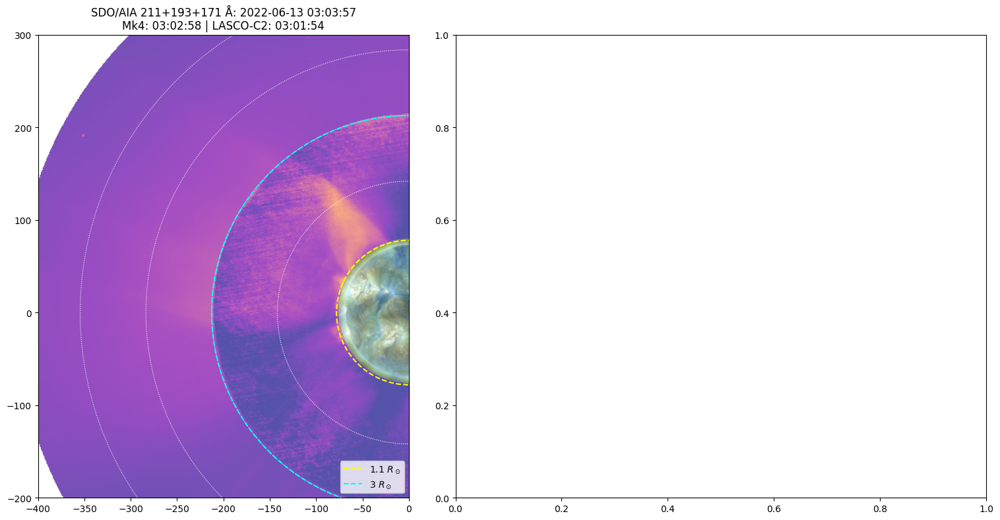

: 

In [158]:
create_integrated_and_diff_movie(start_time_str='2022-06-13T02:55:00', end_time_str='2022-06-13T04:01:00')

# CME計測

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from astropy.time import Time
import pandas as pd
from scipy.optimize import curve_fit
from tqdm import tqdm

def measure_cme_height_manual(ax, map_data, params, r_map, instrument='mk4', click_points=None):
    """
    CMEの高度を手動で計測する関数
    
    Parameters:
    -----------
    ax : matplotlib.axes
        プロット用のAxes
    map_data : np.ndarray
        画像データ
    params : dict
        パラメータ辞書 (nx, ny, cx, cy, px_per_rsun)
    r_map : np.ndarray
        半径マップ (太陽半径単位)
    instrument : str
        観測機器名 ('mk4' または 'lasco')
    click_points : list of tuples, optional
        手動で指定する点のリスト [(x1, y1), (x2, y2), ...]
        
    Returns:
    --------
    heights : list
        測定されたCME先端の高度 (太陽半径単位)
    positions : list of tuples
        測定点の座標 [(x, y), ...]
    """
    
    if click_points is None:
        print(f"{instrument}画像上でCMEの先端をクリックしてください。右クリックで終了。")
        click_points = []
        
        def onclick(event):
            if event.button == 1:  # 左クリック
                if event.inaxes == ax:
                    click_points.append((event.xdata, event.ydata))
                    ax.plot(event.xdata, event.ydata, 'ro', markersize=8, markeredgecolor='white')
                    plt.draw()
            elif event.button == 3:  # 右クリック
                plt.disconnect(cid)
                
        cid = plt.connect('button_press_event', onclick)
        plt.show()
    
    # クリック点から高度を計算
    heights = []
    positions = []
    
    for x_pixel, y_pixel in click_points:
        # ピクセル座標を太陽中心からの距離に変換
        x_from_center = x_pixel - params['cx']
        y_from_center = y_pixel - params['cy']
        
        # 太陽半径単位での距離を計算
        distance_rsun = np.sqrt(x_from_center**2 + y_from_center**2) / params['px_per_rsun']
        
        heights.append(distance_rsun)
        positions.append((x_pixel, y_pixel))
        
        # 測定点をプロット
        ax.scatter(x_pixel, y_pixel, c='red', s=100, marker='o', 
                  edgecolors='white', linewidth=2, zorder=10,
                  label=f'CME leading edge: {distance_rsun:.2f} R☉')
    
    return heights, positions

def fit_cme_kinematics(times, heights):
    """
    CMEの運動学的パラメータをフィッティング
    
    Parameters:
    -----------
    times : list
        時刻リスト (astropy.time.Time objects)
    heights : list
        対応する高度リスト (太陽半径単位)
        
    Returns:
    --------
    fit_params : dict
        フィッティング結果 {'v0': 初期速度, 'a': 加速度, 'h0': 初期高度}
    fit_func : function
        フィッティング関数
    """
    
    # 時刻を秒単位の相対時間に変換
    t0 = times[0]
    t_seconds = [(t - t0).to_value('s') for t in times]
    
    # 2次多項式フィッティング: h(t) = h0 + v0*t + 0.5*a*t^2
    def kinematic_model(t, h0, v0, a):
        return h0 + v0 * np.array(t) + 0.5 * a * np.array(t)**2
    
    try:
        popt, pcov = curve_fit(kinematic_model, t_seconds, heights)
        h0, v0, a = popt
        
        fit_params = {
            'h0': h0,          # 初期高度 [R☉]
            'v0': v0,          # 初期速度 [R☉/s]
            'a': a,            # 加速度 [R☉/s²]
            'v0_km_s': v0 * 695700,  # 初期速度 [km/s]
            'a_km_s2': a * 695700    # 加速度 [km/s²]
        }
        
        return fit_params, kinematic_model
        
    except Exception as e:
        print(f"フィッティングエラー: {e}")
        return None, None

def plot_cme_height_evolution(times, heights, fit_params=None, fit_func=None):
    """
    CME高度の時間発展をプロット
    
    Parameters:
    -----------
    times : list
        時刻リスト
    heights : list
        高度リスト
    fit_params : dict, optional
        フィッティングパラメータ
    fit_func : function, optional
        フィッティング関数
    """
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 時刻を分単位に変換
    t0 = times[0]
    t_minutes = [(t - t0).to_value('min') for t in times]
    
    # 高度-時間プロット
    ax1.scatter(t_minutes, heights, c='red', s=100, marker='o', 
               edgecolors='black', linewidth=1, label='CME nose height')
    
    if fit_params and fit_func:
        t_fine = np.linspace(0, max(t_minutes), 100)
        t_fine_sec = np.array(t_fine) * 60  # 分を秒に変換
        h_fit = fit_func(t_fine_sec, fit_params['h0'], fit_params['v0'], fit_params['a'])
        ax1.plot(t_fine, h_fit, 'b-', linewidth=2, 
                label=f"Fit: v₀={fit_params['v0_km_s']:.0f} km/s, a={fit_params['a_km_s2']:.1f} km/s²")
    
    ax1.set_xlabel('Time (min) since ' + times[0].iso)
    ax1.set_ylabel('CME nose height ($R_\odot$)')
    ax1.set_title('CME height evolution')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # 速度-時間プロット
    if len(times) > 1:
        velocities = []
        t_vel = []
        for i in range(1, len(times)):
            dt = (times[i] - times[i-1]).to_value('s')
            dh = heights[i] - heights[i-1]
            v = dh / dt * 695700  # km/s に変換
            velocities.append(v)
            t_vel.append((t_minutes[i] + t_minutes[i-1]) / 2)
        
        ax2.scatter(t_vel, velocities, c='blue', s=100, marker='s',
                   edgecolors='black', linewidth=1, label='CME velocity (km/s)')
        
        if fit_params:
            v_fit = fit_params['v0_km_s'] + fit_params['a_km_s2'] * np.array(t_vel) * 60
            ax2.plot(t_vel, v_fit, 'r-', linewidth=2, label='Fit velocity (km/s)')
        
        ax2.set_xlabel('Time (min) since ' + times[0].iso)
        ax2.set_ylabel('CME velocity (km/s)')
        ax2.set_title('CME velocity evolution')
        ax2.grid(True, alpha=0.3)
        ax2.legend()
    
    plt.tight_layout()
    return fig

def analyze_cme_height_time_series(start_time_str: str, end_time_str: str, 
                                  time_interval_min: int = 1):
    """
    03:00-04:01の時間範囲でCME高度を時系列解析
    
    Parameters:
    -----------
    start_time_str : str
        開始時刻 'YYYY-MM-DDTHH:MM:SS'
    end_time_str : str
        終了時刻 'YYYY-MM-DDTHH:MM:SS'
    time_interval_min : int
        時間間隔 (分)
        
    Returns:
    --------
    results : dict
        解析結果を含む辞書
    """
    
    print("CME高度の時系列解析を開始します...")
    
    # 時刻リストを作成
    start_time = Time(start_time_str)
    end_time = Time(end_time_str)
    current_time = start_time
    time_list = []
    
    while current_time <= end_time:
        time_list.append(current_time)
        current_time += time_interval_min * u.min
    
    heights_mk4 = []
    heights_lasco = []
    times_measured = []
    
    print(f"{len(time_list)}個の時刻でCME高度を測定します...")
    
    for i, target_time in enumerate(tqdm(time_list)):
        try:
            # 統合画像を作成
            fig, ax = plt.subplots(figsize=(12, 12))
            create_single_integrated_image(ax, target_time.iso)
            
            # この時点で手動またはスクリプトでCME先端を指定
            # 実際の使用では、ユーザーが画像を見て座標を指定する
            
            # サンプル座標（実際の解析では適切な座標に置き換える）
            if target_time.iso == '2022-06-13T03:00:00.000':
                # MK4領域のCME先端例
                mk4_points = [(-150, 50)]  # サンプル座標
                lasco_points = []
            elif target_time.iso >= '2022-06-13T03:24:00.000':
                # LASCO領域にCMEが到達
                mk4_points = []
                lasco_points = [(-250, 100)]  # サンプル座標
            else:
                mk4_points = [(-180, 80)]
                lasco_points = []
            
            # 実際のパラメータを取得（簡略化）
            params = {'cx': 256, 'cy': 256, 'px_per_rsun': 80}  # 実際の値に置き換え
            r_map = np.sqrt(np.indices((512, 512))[0]**2 + np.indices((512, 512))[1]**2)
            
            # CME高度を測定
            if mk4_points:
                h_mk4, _ = measure_cme_height_manual(ax, None, params, r_map, 
                                                   'mk4', mk4_points)
                heights_mk4.extend(h_mk4)
                times_measured.append(target_time)
            
            if lasco_points:
                h_lasco, _ = measure_cme_height_manual(ax, None, params, r_map,
                                                     'lasco', lasco_points)
                heights_lasco.extend(h_lasco)
                if not mk4_points:  # LASCOのみの場合
                    times_measured.append(target_time)
            
            plt.close(fig)
            
        except Exception as e:
            print(f"時刻 {target_time.iso} でエラー: {e}")
            continue
    
    # 結果をまとめる
    all_heights = heights_mk4 + heights_lasco
    
    if len(all_heights) > 2 and len(times_measured) > 2:
        # 運動学的フィッティング
        fit_params, fit_func = fit_cme_kinematics(times_measured, all_heights)
        
        # 結果をプロット
        plot_fig = plot_cme_height_evolution(times_measured, all_heights, 
                                           fit_params, fit_func)
        
        results = {
            'times': times_measured,
            'heights': all_heights,
            'heights_mk4': heights_mk4,
            'heights_lasco': heights_lasco,
            'fit_params': fit_params,
            'plot_figure': plot_fig
        }
        
        return results
    
    else:
        print("データが不足しています。より多くの測定点が必要です。")
        return None

def plot_integrated_image_with_cme_overlay(target_time_str: str, 
                                         cme_positions: list = None,
                                         show_height_circles: bool = True):
    """
    統合画像にCME先端位置をオーバーレイしてプロット
    
    Parameters:
    -----------
    target_time_str : str
        対象時刻 'YYYY-MM-DDTHH:MM:SS'
    cme_positions : list of tuples
        CME先端位置のリスト [(x1, y1), (x2, y2), ...]
    show_height_circles : bool
        高度円を表示するかどうか
    """
    
    fig, ax = plt.subplots(figsize=(12, 12))
    
    # 統合画像を作成
    create_single_integrated_image(ax, target_time_str)
    
    if cme_positions:
        # CME先端位置をスキャッタープロット
        x_coords = [pos[0] for pos in cme_positions]
        y_coords = [pos[1] for pos in cme_positions]
        
        ax.scatter(x_coords, y_coords, c='red', s=150, marker='*',
                  edgecolors='white', linewidth=2, zorder=15,
                  label='CME Leading Edge')
        
        # 各点に高度ラベルを追加
        params = {'cx': 256, 'cy': 256, 'px_per_rsun': 80}  # 実際の値に置き換え
        for i, (x, y) in enumerate(cme_positions):
            distance_rsun = np.sqrt((x - params['cx'])**2 + (y - params['cy'])**2) / params['px_per_rsun']
            ax.annotate(f'{distance_rsun:.2f} R☉', 
                       (x, y), xytext=(10, 10), 
                       textcoords='offset points',
                       color='white', fontsize=12, fontweight='bold',
                       bbox=dict(boxstyle='round,pad=0.3', facecolor='red', alpha=0.7))
    
    # if show_height_circles:
    #     # 追加の高度円を描画
    #     theta = np.linspace(0, 2*np.pi, 100)
    #     params = {'cx': 256, 'cy': 256, 'px_per_rsun': 80}  # 実際の値に置き換え
        
    #     for r in [1, 2, 3, 4, 5, 6]:
    #         r_pixel = r * params['px_per_rsun']
    #         x_circle = params['cx'] + r_pixel * np.cos(theta)
    #         y_circle = params['cy'] + r_pixel * np.sin(theta)
    #         ax.plot(x_circle, y_circle, '--', color='yellow', alpha=0.6, linewidth=1,
    #                label=f'{r} R☉' if r == 1.5 else '')
    
    ax.legend(loc='upper right')
    plt.title(f'CME Height Measurement - {target_time_str}', fontsize=14, pad=20)
    plt.tight_layout()
    
    return fig, ax

## 実行


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:24:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



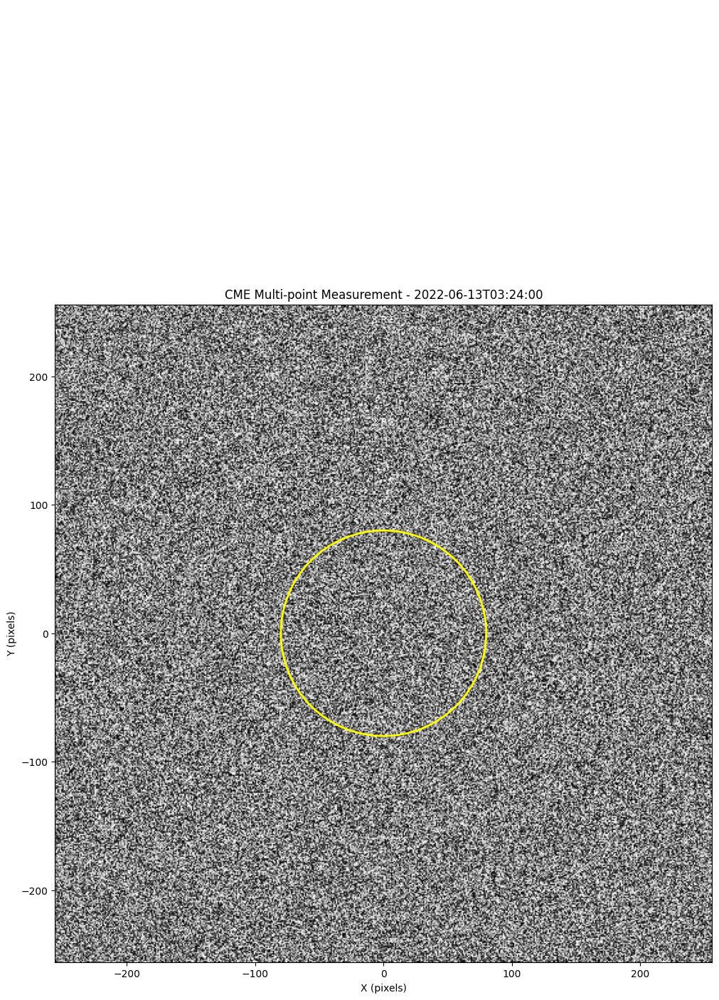

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:00:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



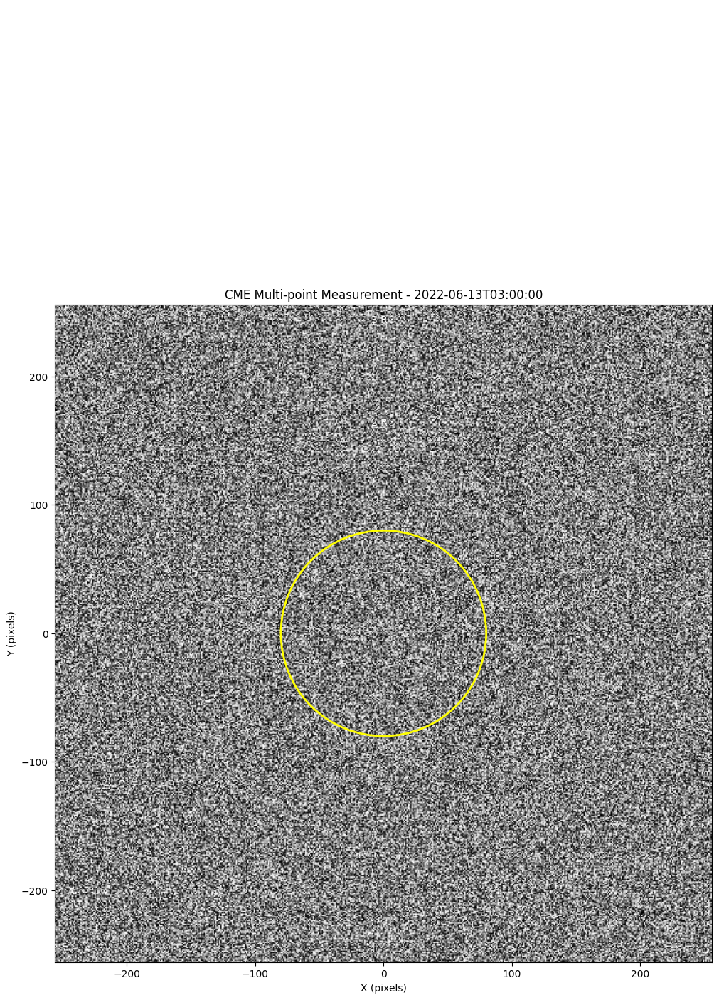

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:12:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



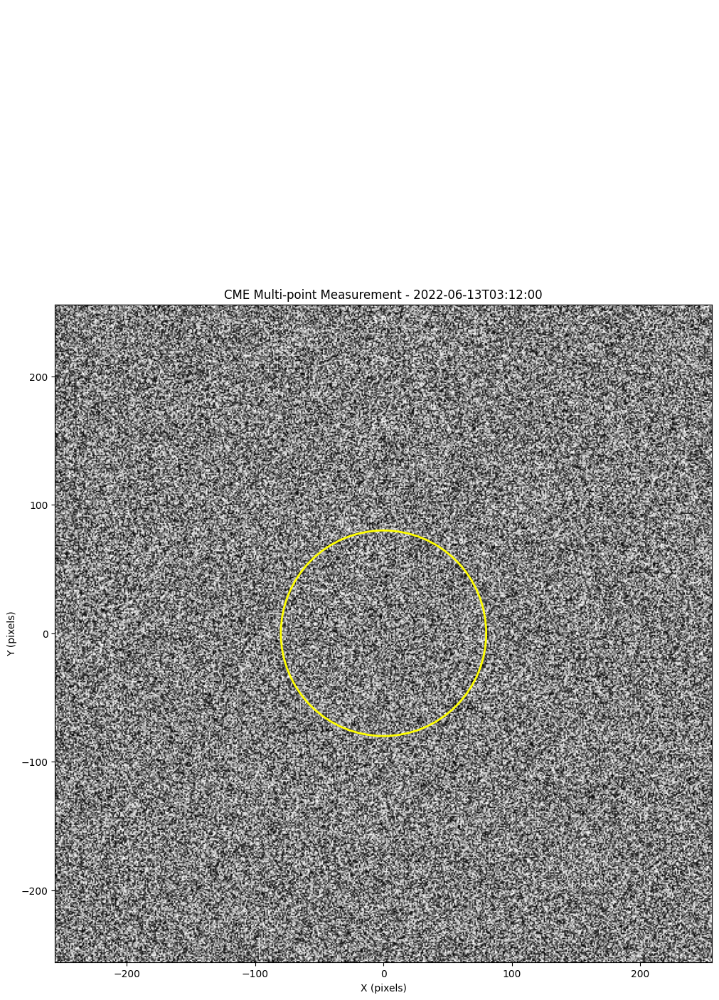

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:24:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



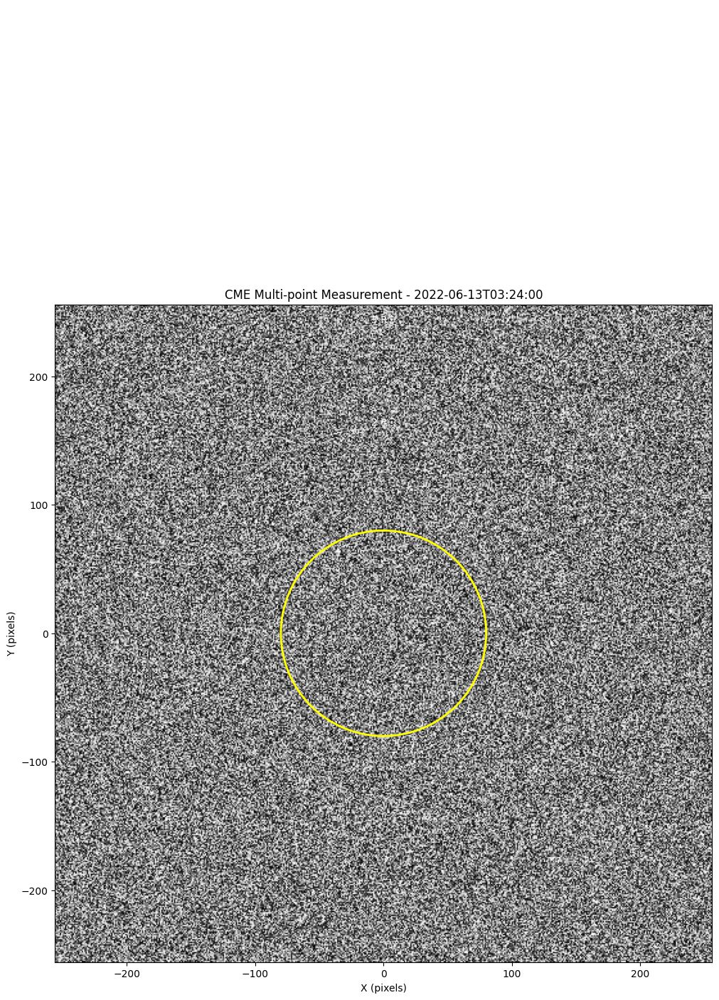

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:36:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



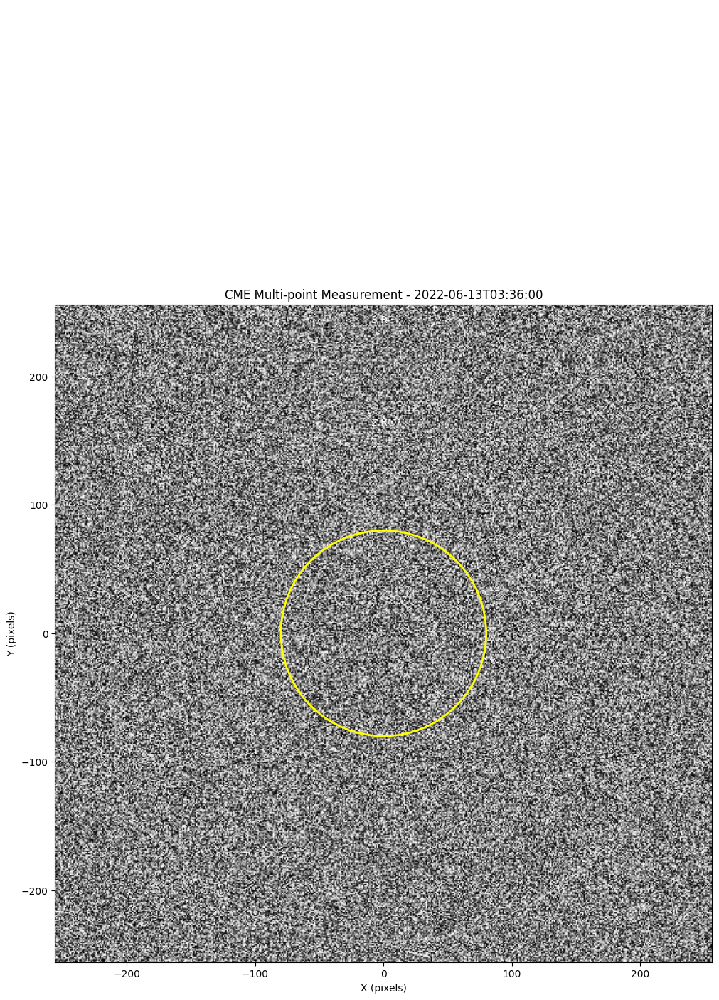

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T03:48:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



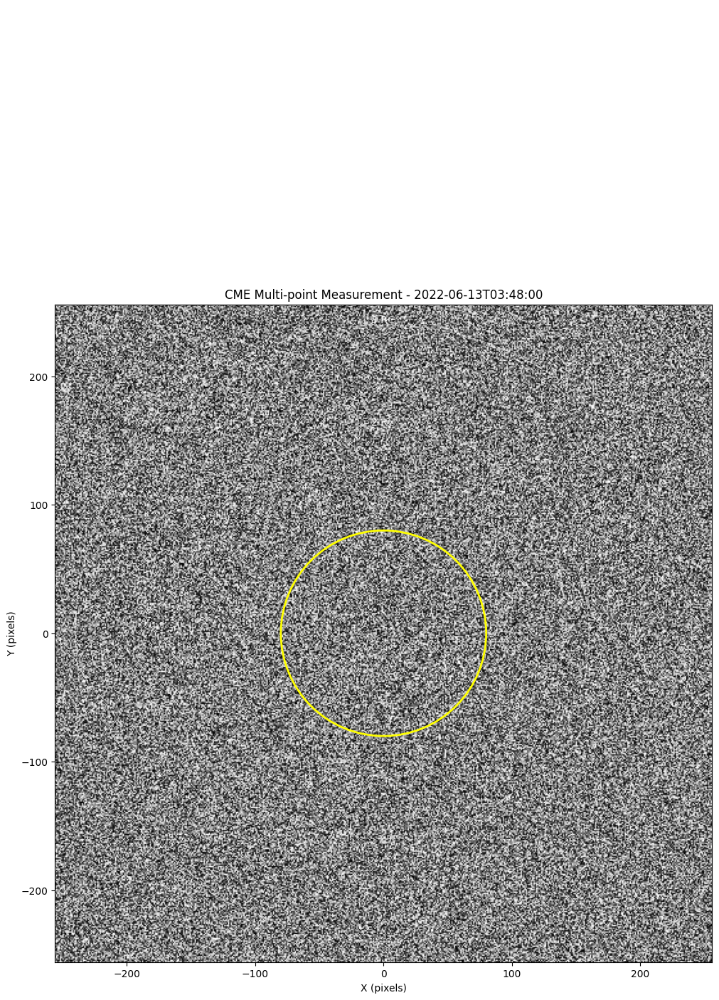

測定点が選択されませんでした。


=== CME高度の複数点計測 ===
対象時刻: 2022-06-13T04:00:00

combined画像上でCMEの複数点をクリックしてください。
左クリック: 測定点を追加
右クリック: 測定終了



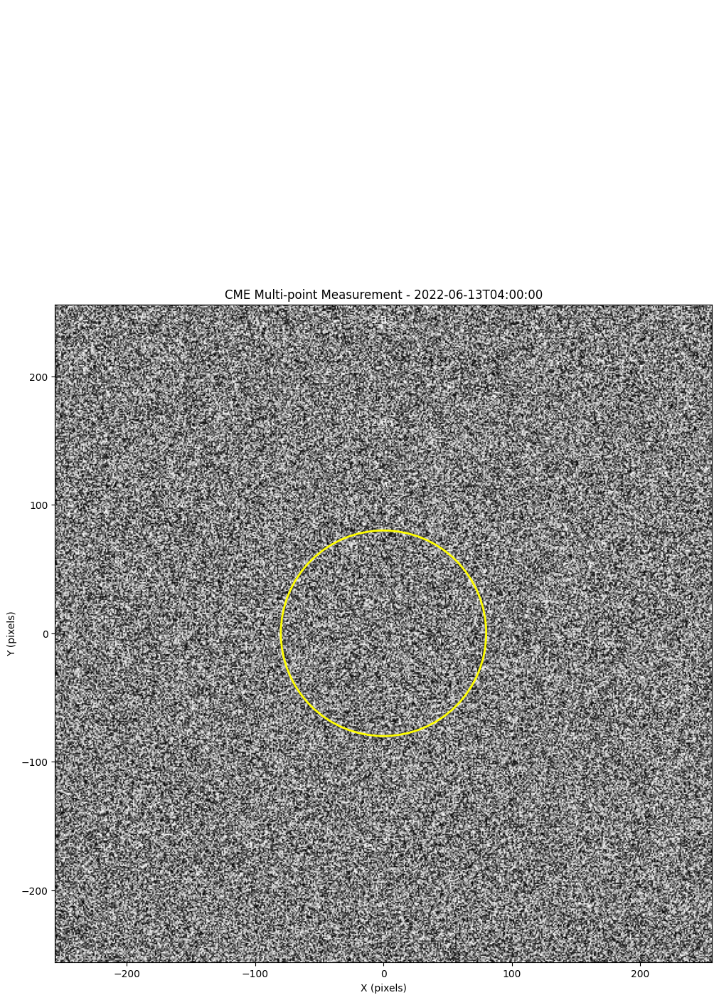

測定点が選択されませんでした。


In [37]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from astropy.time import Time
import pandas as pd
from scipy.optimize import curve_fit
from tqdm import tqdm

def measure_cme_height_manual_multi_points(ax, map_data, params, r_map, instrument='mk4', click_points=None):
    """
    CMEの高度を複数点で手動計測する関数
    
    Parameters:
    -----------
    ax : matplotlib.axes
        プロット用のAxes
    map_data : np.ndarray
        画像データ
    params : dict
        パラメータ辞書 (nx, ny, cx, cy, px_per_rsun)
    r_map : np.ndarray
        半径マップ (太陽半径単位)
    instrument : str
        観測機器名 ('mk4' または 'lasco')
    click_points : list of tuples, optional
        手動で指定する点のリスト [(x1, y1), (x2, y2), ...]
        
    Returns:
    --------
    heights : list
        測定されたCME先端の高度 (太陽半径単位)
    positions : list of tuples
        測定点の座標 [(x, y), ...]
    angles : list
        各測定点の位置角度 (度)
    """
    
    if click_points is None:
        print(f"\n{instrument}画像上でCMEの複数点をクリックしてください。")
        print("左クリック: 測定点を追加")
        print("右クリック: 測定終了\n")
        click_points = []
        
        def onclick(event):
            if event.button == 1:  # 左クリック
                if event.inaxes == ax:
                    click_points.append((event.xdata, event.ydata))
                    # 点をプロット
                    ax.plot(event.xdata, event.ydata, 'ro', markersize=8, 
                           markeredgecolor='white', markeredgewidth=2)
                    # 点番号を表示
                    ax.text(event.xdata + 5, event.ydata + 5, str(len(click_points)), 
                           color='yellow', fontsize=10, fontweight='bold')
                    plt.draw()
            elif event.button == 3:  # 右クリック
                plt.disconnect(cid)
                plt.close()
                
        cid = plt.connect('button_press_event', onclick)
        plt.show()
    
    # クリック点から高度と位置角を計算
    heights = []
    positions = []
    angles = []
    
    for i, (x_pixel, y_pixel) in enumerate(click_points):
        # ピクセル座標を太陽中心からの距離に変換
        x_from_center = x_pixel - params['cx']
        y_from_center = y_pixel - params['cy']
        
        # 太陽半径単位での距離を計算
        distance_rsun = np.sqrt(x_from_center**2 + y_from_center**2) / params['px_per_rsun']
        
        # 位置角度を計算（北から時計回りに0-360度）
        angle = np.degrees(np.arctan2(x_from_center, -y_from_center))
        if angle < 0:
            angle += 360
        
        heights.append(distance_rsun)
        positions.append((x_pixel, y_pixel))
        angles.append(angle)
        
        print(f"測定点 {i+1}: 高度 = {distance_rsun:.2f} R☉, 位置角 = {angle:.1f}°")
    
    return heights, positions, angles

def plot_cme_height_distribution(heights, angles, time_str, instrument='mk4'):
    """
    CME高度の角度分布をプロット
    
    Parameters:
    -----------
    heights : list
        高度リスト (太陽半径単位)
    angles : list
        位置角度リスト (度)
    time_str : str
        観測時刻
    instrument : str
        観測機器名
    """
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # 1. 高度 vs 位置角度のプロット
    ax1.scatter(angles, heights, c='red', s=100, marker='o', 
               edgecolors='black', linewidth=1)
    ax1.set_xlabel('Position Angle (degrees)')
    ax1.set_ylabel('Height (R☉)')
    ax1.set_title(f'CME Height Distribution - {time_str}')
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(0, 360)
    
    # 平均高度と標準偏差を表示
    mean_height = np.mean(heights)
    std_height = np.std(heights)
    ax1.axhline(y=mean_height, color='blue', linestyle='--', 
               label=f'Mean: {mean_height:.2f} ± {std_height:.2f} R☉')
    ax1.fill_between([0, 360], mean_height - std_height, mean_height + std_height,
                    color='blue', alpha=0.2)
    ax1.legend()
    
    # 2. 極座標プロット
    ax2 = plt.subplot(122, projection='polar')
    theta = np.radians(angles)
    ax2.scatter(theta, heights, c='red', s=100, marker='o', 
               edgecolors='black', linewidth=1)
    
    # 測定点を線で結ぶ
    if len(angles) > 2:
        # 角度順にソート
        sorted_indices = np.argsort(angles)
        sorted_angles = [angles[i] for i in sorted_indices]
        sorted_heights = [heights[i] for i in sorted_indices]
        sorted_theta = np.radians(sorted_angles)
        
        # 閉じた曲線にする
        sorted_theta = np.append(sorted_theta, sorted_theta[0])
        sorted_heights = np.append(sorted_heights, sorted_heights[0])
        
        ax2.plot(sorted_theta, sorted_heights, 'b-', linewidth=2, alpha=0.5)
    
    ax2.set_theta_zero_location('N')
    ax2.set_theta_direction(-1)
    ax2.set_title(f'CME Shape ({instrument.upper()})', pad=20)
    ax2.set_ylim(0, max(heights) * 1.2)
    ax2.grid(True)
    
    plt.tight_layout()
    return fig

def analyze_single_time_cme_multi_points(target_time_str: str, 
                                       save_results: bool = True,
                                       output_dir: str = './cme_analysis/'):
    """
    特定時刻のCME高度を複数点で計測し解析
    
    Parameters:
    -----------
    target_time_str : str
        対象時刻 'YYYY-MM-DDTHH:MM:SS'
    save_results : bool
        結果を保存するかどうか
    output_dir : str
        出力ディレクトリ
        
    Returns:
    --------
    results : dict
        解析結果
    """
    
    print(f"\n=== CME高度の複数点計測 ===")
    print(f"対象時刻: {target_time_str}")
    
    # 統合画像を作成（実際の実装では適切な関数を使用）
    fig, ax = plt.subplots(figsize=(12, 12))
    
    # ダミー画像（実際の実装では create_single_integrated_image を使用）
    dummy_image = np.random.rand(512, 512)
    ax.imshow(dummy_image, cmap='gray', extent=[-256, 256, -256, 256])
    
    # 太陽円盤と高度円を描画
    params = {'cx': 0, 'cy': 0, 'px_per_rsun': 80}
    
    # 太陽円盤
    sun_circle = Circle((params['cx'], params['cy']), params['px_per_rsun'], 
                       fill=False, color='yellow', linewidth=2)
    ax.add_patch(sun_circle)
    
    # 高度円
    for r in [2, 3, 4, 5, 6]:
        height_circle = Circle((params['cx'], params['cy']), 
                             r * params['px_per_rsun'], 
                             fill=False, color='white', linewidth=1, 
                             linestyle='--', alpha=0.5)
        ax.add_patch(height_circle)
        ax.text(params['cx'], params['cy'] + r * params['px_per_rsun'], 
               f'{r} R☉', color='white', ha='center', va='bottom')
    
    ax.set_xlim(-256, 256)
    ax.set_ylim(-256, 256)
    ax.set_xlabel('X (pixels)')
    ax.set_ylabel('Y (pixels)')
    ax.set_title(f'CME Multi-point Measurement - {target_time_str}')
    
    # CME高度を複数点で計測
    r_map = np.sqrt(np.indices((512, 512))[0]**2 + np.indices((512, 512))[1]**2)
    heights, positions, angles = measure_cme_height_manual_multi_points(
        ax, dummy_image, params, r_map, 'combined'
    )
    
    if len(heights) > 0:
        # 結果をプロット
        fig2 = plot_cme_height_distribution(heights, angles, target_time_str)
        
        # 統計情報を計算
        stats = {
            'n_points': len(heights),
            'mean_height': np.mean(heights),
            'std_height': np.std(heights),
            'min_height': np.min(heights),
            'max_height': np.max(heights),
            'height_range': np.max(heights) - np.min(heights)
        }
        
        print(f"\n=== 測定結果の統計 ===")
        print(f"測定点数: {stats['n_points']}")
        print(f"平均高度: {stats['mean_height']:.2f} ± {stats['std_height']:.2f} R☉")
        print(f"最小高度: {stats['min_height']:.2f} R☉")
        print(f"最大高度: {stats['max_height']:.2f} R☉")
        print(f"高度範囲: {stats['height_range']:.2f} R☉")
        
        # 結果を保存
        if save_results:
            import os
            os.makedirs(output_dir, exist_ok=True)
            
            # データをCSVで保存
            df = pd.DataFrame({
                'point_id': range(1, len(heights) + 1),
                'x_pixel': [p[0] for p in positions],
                'y_pixel': [p[1] for p in positions],
                'height_rsun': heights,
                'position_angle_deg': angles
            })
            
            time_label = target_time_str.replace(':', '').replace('-', '')
            csv_filename = os.path.join(output_dir, f'cme_heights_{time_label}.csv')
            df.to_csv(csv_filename, index=False)
            print(f"\nデータを保存: {csv_filename}")
            
            # プロットを保存
            plot_filename = os.path.join(output_dir, f'cme_analysis_{time_label}.png')
            fig2.savefig(plot_filename, dpi=300, bbox_inches='tight')
            print(f"プロットを保存: {plot_filename}")
        
        results = {
            'time': target_time_str,
            'heights': heights,
            'positions': positions,
            'angles': angles,
            'statistics': stats,
            'dataframe': df
        }
        
        return results
    
    else:
        print("測定点が選択されませんでした。")
        return None

def compare_cme_heights_multiple_times(time_list: list, 
                                     save_comparison: bool = True,
                                     output_dir: str = './cme_analysis/'):
    """
    複数時刻のCME高度測定結果を比較
    
    Parameters:
    -----------
    time_list : list
        時刻文字列のリスト
    save_comparison : bool
        比較結果を保存するかどうか
    output_dir : str
        出力ディレクトリ
    """
    
    all_results = []
    
    for time_str in time_list:
        print(f"\n{'='*50}")
        result = analyze_single_time_cme_multi_points(time_str, save_results=True, 
                                                    output_dir=output_dir)
        if result:
            all_results.append(result)
    
    if len(all_results) > 1:
        # 時系列比較プロット
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
        
        times = [r['time'] for r in all_results]
        mean_heights = [r['statistics']['mean_height'] for r in all_results]
        std_heights = [r['statistics']['std_height'] for r in all_results]
        max_heights = [r['statistics']['max_height'] for r in all_results]
        min_heights = [r['statistics']['min_height'] for r in all_results]
        
        # 平均高度の時間変化
        ax1.errorbar(range(len(times)), mean_heights, yerr=std_heights, 
                    fmt='o-', capsize=5, capthick=2, markersize=8)
        ax1.set_xticks(range(len(times)))
        ax1.set_xticklabels([t.split('T')[1][:5] for t in times], rotation=45)
        ax1.set_ylabel('Mean CME Height (R☉)')
        ax1.set_title('CME Height Evolution')
        ax1.grid(True, alpha=0.3)
        
        # 高度範囲の時間変化
        ax2.fill_between(range(len(times)), min_heights, max_heights, 
                        alpha=0.3, color='blue', label='Height range')
        ax2.plot(range(len(times)), mean_heights, 'ro-', markersize=8, 
                label='Mean height')
        ax2.set_xticks(range(len(times)))
        ax2.set_xticklabels([t.split('T')[1][:5] for t in times], rotation=45)
        ax2.set_ylabel('CME Height (R☉)')
        ax2.set_xlabel('Time (UT)')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        
        if save_comparison:
            comparison_filename = os.path.join(output_dir, 'cme_height_comparison.png')
            fig.savefig(comparison_filename, dpi=300, bbox_inches='tight')
            print(f"\n比較プロットを保存: {comparison_filename}")
        
        plt.show()
    
    return all_results

# 使用例
if __name__ == "__main__":
    # 1. 単一時刻の解析
    target_time = '2022-06-13T03:24:00'
    result = analyze_single_time_cme_multi_points(target_time)
    
    # 2. 複数時刻の比較解析
    time_series = [
        '2022-06-13T03:00:00',
        '2022-06-13T03:12:00',
        '2022-06-13T03:24:00',
        '2022-06-13T03:36:00',
        '2022-06-13T03:48:00',
        '2022-06-13T04:00:00'
    ]
    
    all_results = compare_cme_heights_multiple_times(time_series)

# memo

1チャンネルSDOを動画化

In [ ]:
import logging
logging.getLogger('sunpy.map.mapbase').setLevel(logging.WARNING)
logging.getLogger('sunpy').setLevel(logging.WARNING)
import os
import gc
import io
import glob
import re
import numpy as np
import matplotlib.pyplot as plt
import imageio
from astropy.time import Time
from astropy import units as u
from pathlib import Path
from tqdm import tqdm
from matplotlib.colors import Normalize

# 必要な関数は既存定義とします:
# create_corrected_lasco_map, combine_corona_data, calculate_r_map, scan_directory_for_maps

def create_coronal_movie(start_time_str: str,
                         end_time_str: str,
                         mk4_dir: str,
                         lasco_dir: str,
                         aia_dir: str,
                         fps: int = 10):
    """
    start_time_str, end_time_str: 'YYYY-MM-DDTHH:MM:SS'
    mk4_dir, lasco_dir, aia_dir: データフォルダ
    fps: フレームレート
    """
    # 1. 時刻変換
    start_time = Time(start_time_str, scale='utc')
    end_time   = Time(end_time_str,   scale='utc')
    
    # 2. マップリスト取得
    mk4_list   = scan_directory_for_maps(Path(mk4_dir), start_time_str, end_time_str)
    lasco_list = scan_directory_for_maps(Path(lasco_dir), start_time_str, end_time_str)
    aia_list   = scan_directory_for_maps(Path(aia_dir), start_time_str, end_time_str)
    if not (mk4_list and lasco_list and aia_list):
        raise FileNotFoundError("指定範囲にデータが不足しています。")
    
    # 3. 出力準備
    out_dir = Path(r"D:\wsl\home\kinno-7010\Research\SDO_Mk4_SOHO")
    out_dir.mkdir(parents=True, exist_ok=True)
    sf = start_time_str.replace(":", "").replace("T", "_")
    ef = end_time_str  .replace(":", "").replace("T", "_")
    output_file = out_dir / f"AIA_Mk4_LASCO_movie_{sf}_{ef}.mp4"
    
    frames = []
    mk4_list.sort(key=lambda x: x[0].date)
    for mk4_map, _ in tqdm(mk4_list, desc="フレーム生成"):
        # 最近接 LASCO/AIA
        _, lasco_path = min(lasco_list, key=lambda x: abs(x[0].date - mk4_map.date))
        lasco_map = create_corrected_lasco_map(lasco_path)
        aia_map, _ = min(aia_list, key=lambda x: abs(x[0].date - mk4_map.date))
        
        # パラメータ＆正規化
        def get_params(m):
            px = m.rsun_obs.to_value(u.arcsec) / m.scale.axis1.to_value(u.arcsec/u.pix)
            return dict(nx=m.data.shape[1], ny=m.data.shape[0],
                        cx=m.meta['crpix1']-1, cy=m.meta['crpix2']-1,
                        px_per_rsun=px)
        p_mk4, p_lasco, p_aia = map(get_params, (mk4_map, lasco_map, aia_map))
        
        mk4_vmin, mk4_vmax = -1, 3.5
        n_mk4 = np.clip((mk4_map.data - mk4_vmin)/(mk4_vmax - mk4_vmin), 0, 1)
        vals = lasco_map.data[lasco_map.data>0]
        lasco_vmin, lasco_vmax = np.percentile(vals, [1,99])
        n_lasco = np.clip((lasco_map.data - lasco_vmin)/(lasco_vmax - lasco_vmin), 0, 1)
        vals = aia_map.data[aia_map.data>0]
        aia_vmin, aia_vmax = np.percentile(vals, [1,99])
        n_aia = np.clip((aia_map.data - aia_vmin)/(aia_vmax - aia_vmin), 0, 1)
        
        # 合成
        r_map = calculate_r_map(p_lasco)
        ranges = dict(mk4_inner=1.1, mk4_outer_lasco_inner=2.3, lasco_outer=6.0)
        composite, interp_mk4, interp_aia = combine_corona_data(
            n_lasco, p_lasco, n_mk4, p_mk4, n_aia, p_aia, r_map, ranges
        )
        
        # 描画
        fig, ax = plt.subplots(figsize=(11,10))
        extent = np.array([
            -p_lasco['cx'], p_lasco['nx'] - p_lasco['cx'],
            -p_lasco['cy'], p_lasco['ny'] - p_lasco['cy']
        ])
        scale = p_lasco['px_per_rsun']
        theta = np.linspace(0,2*np.pi,400)
        
        # 整数倍円
        for i in range(2, int(ranges['lasco_outer'])+1):
            ax.plot(scale*i*np.cos(theta),
                    scale*i*np.sin(theta),
                    linestyle=':', color='gray', linewidth=0.8)
            
        # ──────────────── データ境界円 ────────────────
        # Mk4 内部境界
        r1 = ranges['mk4_inner'] * scale
        ax.plot(r1*np.cos(theta), r1*np.sin(theta),
                '--', color='yellow', linewidth=1.2,
                label=f"{ranges['mk4_inner']} $R_\\odot$ (Mk4 inner)")
        # LASCO 内部境界
        r2 = ranges['mk4_outer_lasco_inner'] * scale
        ax.plot(r2*np.cos(theta), r2*np.sin(theta),
                '--', color='cyan', linewidth=1.2,
                label=f"{ranges['mk4_outer_lasco_inner']} $R_\\odot$ (LASCO start)")
        # ────────────────────────────────────────────
        
        # AIA
        mask_aia = (r_map>=0)&(r_map<ranges['mk4_inner'])
        layer_aia = np.full_like(composite, np.nan)
        layer_aia[mask_aia] = interp_aia[mask_aia]
        ax.imshow(layer_aia, origin='lower',
                  cmap=aia_map.plot_settings['cmap'],
                  norm=aia_map.plot_settings['norm'],
                  extent=extent, aspect='equal', zorder=0)
        
        # Mk4+LASCO
        mask_mk4 = (r_map>=ranges['mk4_inner'])&(r_map<ranges['mk4_outer_lasco_inner'])
        mask_lasco = (r_map>=ranges['mk4_outer_lasco_inner'])&(r_map<=ranges['lasco_outer'])
        combined_ml = np.full_like(composite, np.nan)
        combined_ml[mask_mk4] = interp_mk4[mask_mk4]
        combined_ml[mask_lasco] = composite[mask_lasco]
        ax.imshow(combined_ml, origin='lower', cmap=plt.cm.plasma,
                  norm=Normalize(0,1), extent=extent,
                  aspect='equal', alpha=0.7, zorder=1)
        
        # リム
        ax.add_artist(plt.Circle((0,0), scale, color='white', fill=False, linestyle='--'))
        ax.set_xlabel('X [pixel]'); ax.set_ylabel('Y [pixel]'); ax.set_facecolor('gray')
        ax.set_title(f'SDO/AIA 304 Å: {aia_map.date.strftime('%Y-%m-%d %H:%M:%S')}\nMk4: {mk4_map.date.strftime('%Y-%m-%d %H:%M:%S')}\nSOHO/LASCO-C2: {lasco_map.date.strftime('%Y-%m-%d %H:%M:%S')}', fontsize=16)
        
        ax.legend(loc='upper right', fontsize=10)
        plt.tight_layout()
        
        # バッファに保存して読み込み
        buf = io.BytesIO()
        fig.savefig(buf, format='png', dpi=200)
        buf.seek(0)
        frame = imageio.imread(buf)
        frames.append(frame)
        buf.close()
        plt.close(fig)
        gc.collect()
    
    # 動画書き出し
    imageio.mimwrite(str(output_file), frames,
                     fps=fps, codec='libx264',
                     quality=8, macro_block_size=1)
    print(f"動画を出力しました: {output_file}")

# 使用例
create_coronal_movie(start_time_str='2022-06-13T03:00:00',
                         end_time_str='2022-06-13T03:25:00',
                         mk4_dir='D:/wsl/home/kinno-7010/Research/MK4_coronagraph/MK4_coronagraph_KCOR/Subtraction_data/Rawdata/kcor_nrgf',
                         lasco_dir='D:/wsl/home/kinno-7010/Research/SOHO/LASCO-C2_rawdata',
                         aia_dir='D:/wsl/home/kinno-7010/Research/SDO/AIA/Rawdata',
                         fps= 20)